# Introduction

In this project we use the open meteo weather api, specifically the historical weather:

https://open-meteo.com/en/docs/historical-weather-api  

**Goal**  
The goal is to predict the temperature in a specific location  

**Method**  
* We import the data and separate it into train val and test while keeping the correct order as this is a time series.
* Then we check for stationnarity and apply different differencing to help achieve it.  
* Then we create ACF and PACF plots with the differenced time series in order to identify p,d,q and P,D,Q.
* We tune these parameters using ARIMA, SARIMA and SARIMAX
* Then we predict using ARIMA, SARIMA, and SARIMAX, a linear regrssion, and an elastic net.
* For the linear regression and the elastic net we also test exogene data supplementation and aggregated variables
* Finally we take a look at the reisudals


## Libraries and data import

In [ ]:
!pip install openmeteo-requests --quiet
!pip install requests-cache retry-requests --quiet
!pip install pmdarima --quiet

In [ ]:
import openmeteo_requests

import requests_cache
import pandas as pd
import numpy as np
from retry_requests import retry

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LinearRegression, ElasticNetCV
from sklearn.metrics import mean_squared_error

In [ ]:
import statsmodels.api as sm

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.statespace.sarimax import SARIMAX
import pmdarima as pm
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler

np.random.seed(42)

In [ ]:
# Setup the Open-Meteo API client with cache and retry on error
cache_session = requests_cache.CachedSession('.cache', expire_after = -1)
retry_session = retry(cache_session, retries = 5, backoff_factor = 0.2)
openmeteo = openmeteo_requests.Client(session = retry_session)

In [ ]:
# Make sure all required weather variables are listed here
# The order of variables in hourly or daily is important to assign them correctly below
url = "https://archive-api.open-meteo.com/v1/archive"
params = { # Strasbourg
	"latitude": 48.5839,
	"longitude": 7.7455,
	"start_date": "2020-01-01",
	"end_date": "2023-12-31",
	"hourly": "temperature_2m",
	"timezone": "Europe/Berlin"
}

In [ ]:
def get_data(url, params, column_names):
    responses = openmeteo.weather_api(url, params=params)
    response = responses[0]

    hourly = response.Hourly()

    # Initialize dictionary to store hourly data for each variable
    hourly_data = {"date": pd.date_range(
        start=pd.to_datetime(hourly.Time(), unit="s", utc=True),
        end=pd.to_datetime(hourly.TimeEnd(), unit="s", utc=True),
        freq=pd.Timedelta(seconds=hourly.Interval()),
        inclusive="left"
    )}

    # Loop through each variable and retrieve corresponding data
    for column_name in column_names:
        # Get values for the current variable
        hourly_values = hourly.Variables(column_names.index(column_name)).ValuesAsNumpy()

        # Store values in the dictionary
        hourly_data[column_name] = hourly_values

    # Create DataFrame from the hourly data dictionary
    df = pd.DataFrame(data=hourly_data)

    # Set date column as index
    df.set_index('date', inplace=True)

    # Resample the DataFrame to 3-hour intervals and calculate mean
    df_resampled = df.resample('3h').mean()

    return df_resampled


In [ ]:
df = get_data(url, params, ["temperature_2m"])

In [ ]:
display(df.head())
print(df.shape)

,temperature_2m
date,
2019-12-31 21:00:00+00:00,-3.227000
2020-01-01 00:00:00+00:00,-2.218667
2020-01-01 03:00:00+00:00,-3.085334
2020-01-01 06:00:00+00:00,-3.518667
2020-01-01 09:00:00+00:00,-1.985333


(11689, 1)


In [ ]:
df.describe()

,temperature_2m
count,11689.000000
mean,11.935214
std,7.979125
min,-10.302000
25%,5.764667
50%,11.498000
75%,17.798000
max,36.114666


In [ ]:
df.isnull().values.any()

False

In [ ]:
df.dtypes

date              datetime64[ns, UTC]
temperature_2m                float32
dtype: object

## Transformation - 3hour steps

In this part we modify the time series so that we take the mean of the three next hours and assign them to the first hour.

In [ ]:
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.resample.html


In [ ]:
df_resampled = df.resample('3h').mean()

In [ ]:
df_resampled.head()

,temperature_2m
date,
2019-12-31 21:00:00+00:00,-3.227000
2020-01-01 00:00:00+00:00,-2.218667
2020-01-01 03:00:00+00:00,-3.085334
2020-01-01 06:00:00+00:00,-3.518667
2020-01-01 09:00:00+00:00,-1.985333


## Separation Train Val Test

Here we are separating our data, while taking care of keepingthe time series ordered by dattime to avoid that the model can see in the future

In [ ]:
def split_data_time(X, y, train_size, val_size):
    # Calculate the lengths for training and validation sets
    len_train = int(len(X) * train_size)
    len_val = int(len(X) * val_size)

    # Calculate the indices for splitting
    ind_train_end = len_train
    ind_val_end = ind_train_end + len_val

    # Split the data into training, validation, and test sets
    X_train = X[:ind_train_end]
    X_val = X[ind_train_end:ind_val_end]
    X_test = X[ind_val_end:]

    # Split the labels accordingly
    y_train = y[:ind_train_end]
    y_val = y[ind_train_end:ind_val_end]
    y_test = y[ind_val_end:]

    return X_train, X_val, X_test, y_train, y_val, y_test


In [ ]:
# Split the data into features and target
X = df_resampled.index
y = df_resampled[['temperature_2m']]


In [ ]:
train_size = 0.7
val_size = 0.15

In [ ]:
X_train, X_val, X_test, y_train, y_val, y_test = split_data_time(X, y, train_size, val_size)

In [ ]:
X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape

((8182,), (1753,), (1754,), (8182, 1), (1753, 1), (1754, 1))

# Data exploration

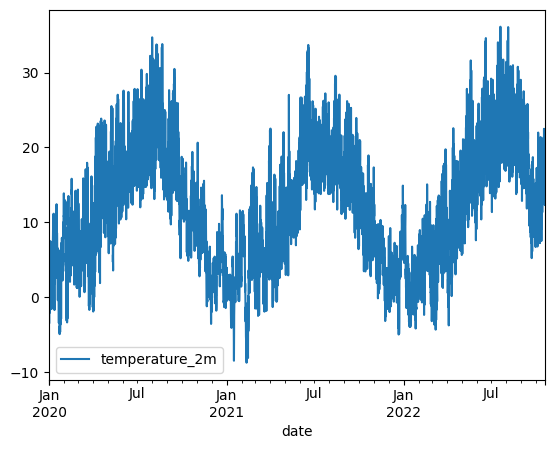

In [ ]:
y_train.plot();

We can see on this first plot, that we have a repeating pattern every year, with peaks in the summer and lows in the winter.

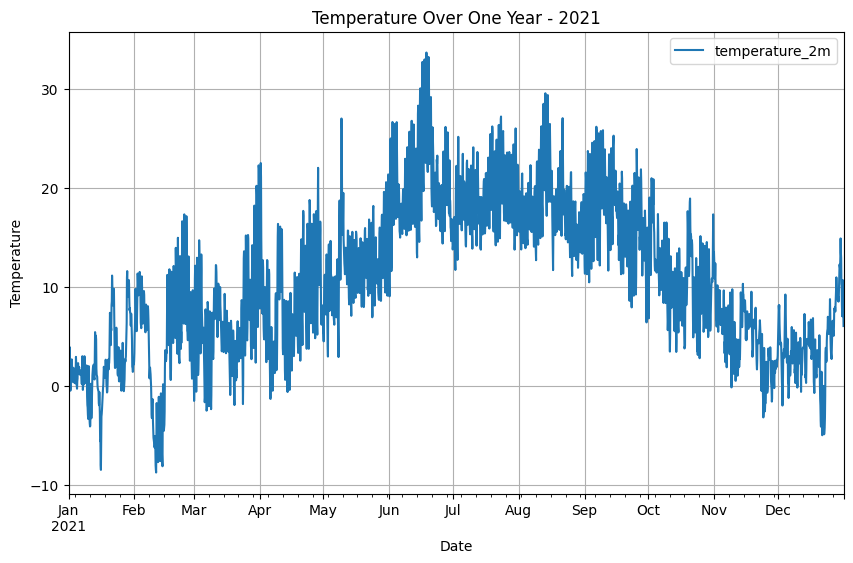

In [ ]:
start_date = '2021-01-01'
end_date = '2021-12-31'

# Slice the DataFrame for the one-year period
df_resampled_year = y_train[start_date:end_date]

# Plot
df_resampled_year.plot(figsize=(10, 6))
plt.title('Temperature Over One Year - 2021')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.grid(True)
plt.show()

There seems to be another pattern as we have differences of up to 20 degrees between some points.

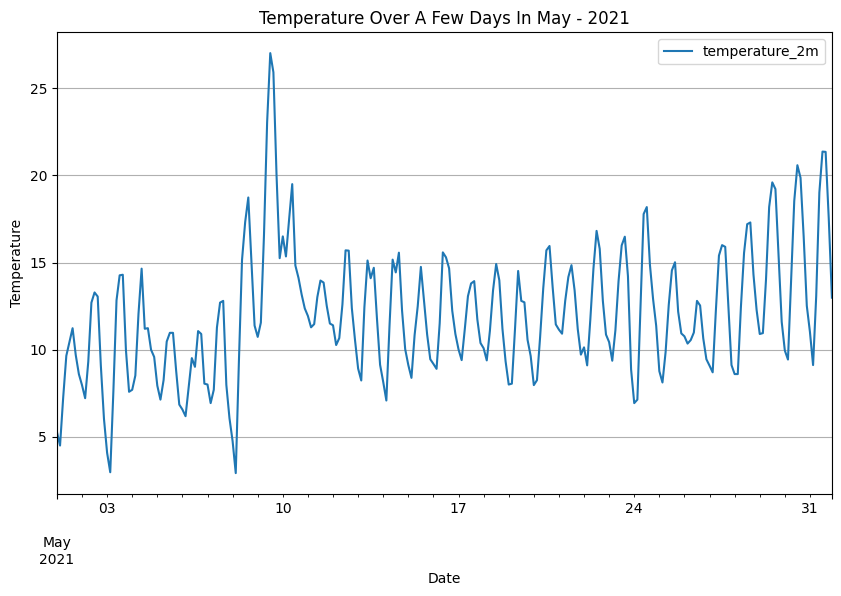

In [ ]:
start_date = '2021-05-01'
end_date = '2021-05-31'

# Slice the DataFrame for the one-year period
df_resampled_days = y_train[start_date:end_date]

# Plot
df_resampled_days.plot(figsize=(10, 6))
plt.title('Temperature Over A Few Days In May - 2021')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.grid(True)
plt.show()

Here we can clearly see that we have daily patterns. The temperature is lower at night and higher at day. As we create 3 hour steps, we have a repeating pattern every 8 steps.


## Explore time series composants

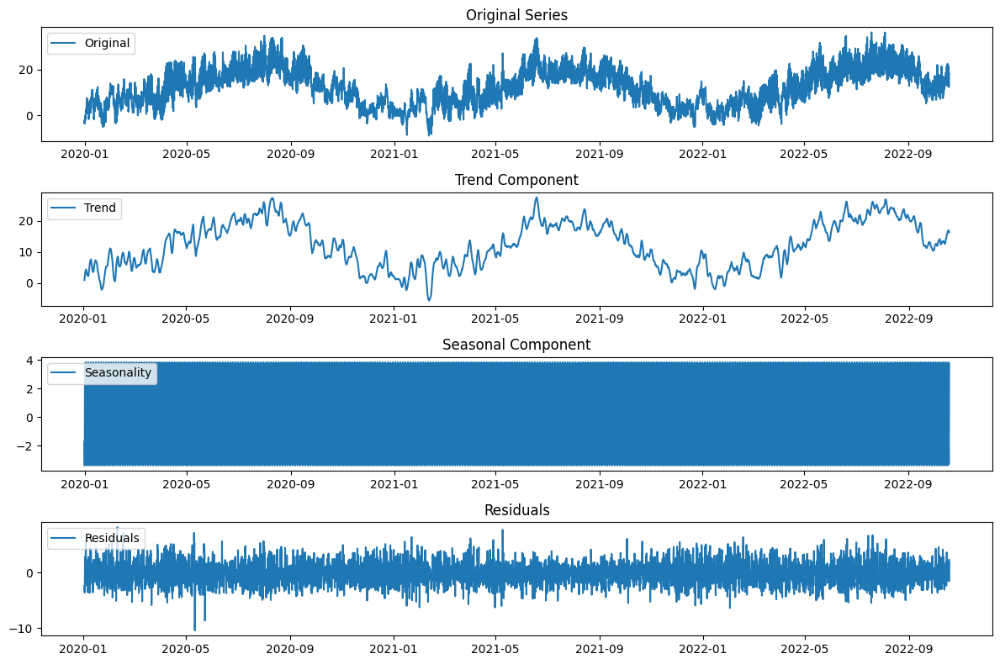

In [ ]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Perform seasonal decomposition
decomposition = sm.tsa.seasonal_decompose(y_train['temperature_2m'], model='additive')

# Access the decomposed components
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Plot the decomposed components
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(y_train['temperature_2m'], label='Original')
plt.legend(loc='upper left')
plt.title('Original Series')

plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='upper left')
plt.title('Trend Component')

plt.subplot(413)
plt.plot(seasonal, label='Seasonality')
plt.legend(loc='upper left')
plt.title('Seasonal Component')

plt.subplot(414)
plt.plot(residual, label='Residuals')
plt.legend(loc='upper left')
plt.title('Residuals')

plt.tight_layout()
plt.show()


The trend seems not to be decreasing or improving. The seasonal component shows that we have a repeating trend in really close steps, these are probably our dayly variations.

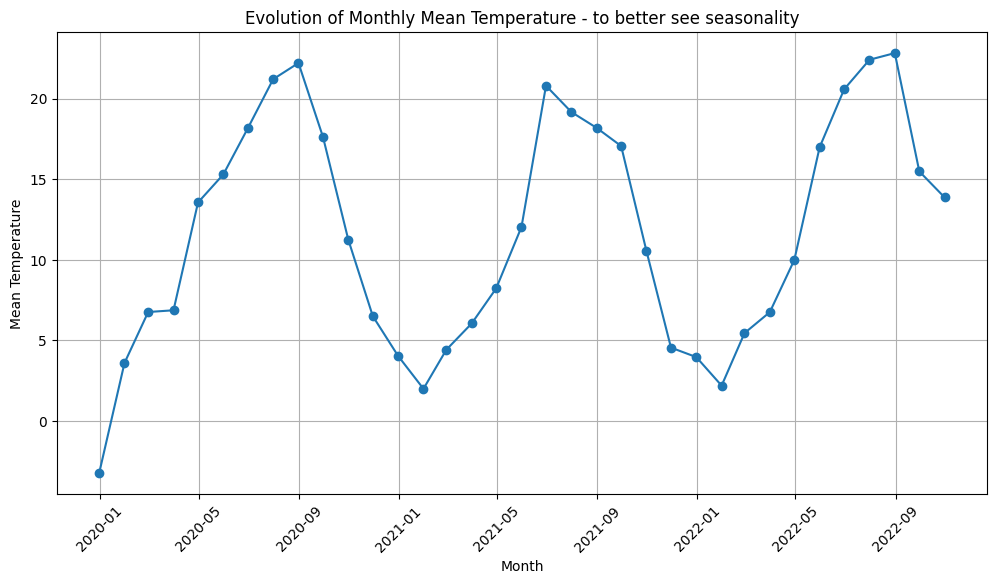

In [ ]:
# mean for each month
monthly_mean = y_train.resample('M').mean()

plt.figure(figsize=(12, 6))

# Plot the evolution of monthly mean temperatures
plt.plot(monthly_mean.index, monthly_mean['temperature_2m'], marker='o', linestyle='-')
plt.xlabel('Month')
plt.ylabel('Mean Temperature')
plt.title('Evolution of Monthly Mean Temperature - to better see seasonality')
plt.grid(True)
plt.xticks(rotation=45)


plt.show()


This plot above and the following clearly show that we have a yearly pattern.

In [ ]:
# Extract year from the index and create a new column
y_train['Year'] = y_train.index.year

In [ ]:
y_train['Year'].value_counts()

2020    2928
2021    2920
2022    2333
2019       1
Name: Year, dtype: int64

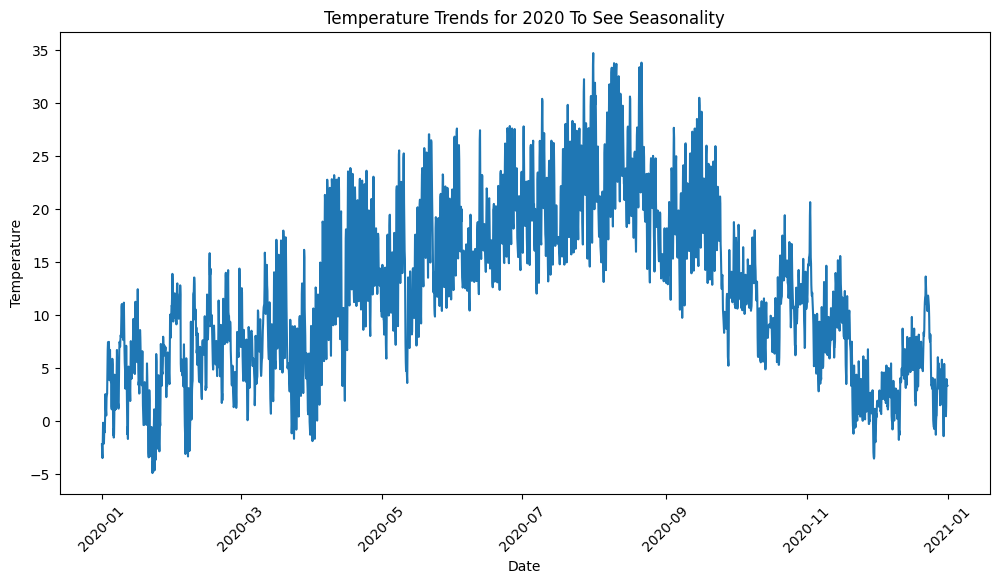

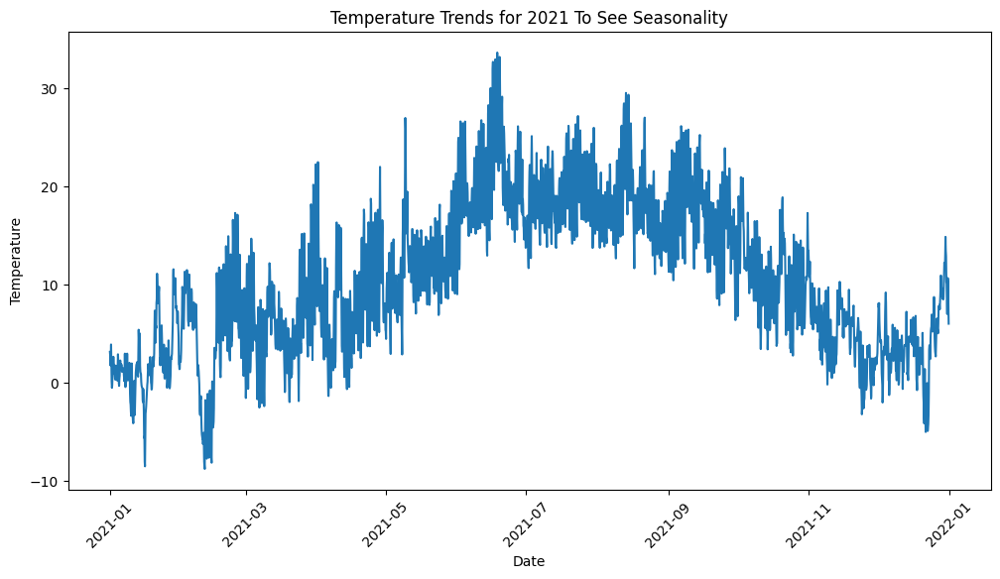

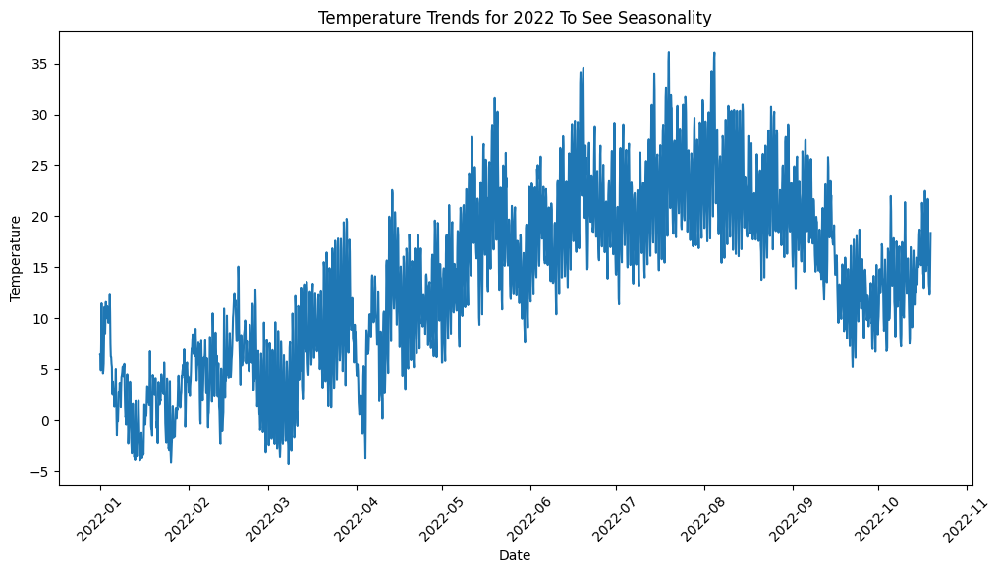

In [ ]:
years = [2020, 2021, 2022]

for year in years:
    data_year = y_train.loc[y_train['Year'] == year]
    plt.figure(figsize=(12, 6))

    # Plot temperature data for the current year
    plt.title(f'Temperature Trends for {year} To See Seasonality')
    plt.plot(data_year.index, data_year['temperature_2m'], label=str(year))

    plt.xticks(rotation=45)
    plt.xlabel('Date')
    plt.ylabel('Temperature')

y_train = y_train.drop(columns="Year")




So we find seasonality as follows:
- every year
- every day

## Check for stationnary using Augmented Dickey Fuller and KPSS tests

In [ ]:
from statsmodels.tsa import stattools

# Augmented Dickey-Fuller test
def check_adf_stat(ts):

  adf_results = stattools.adfuller(ts)
  adf_stat = adf_results[0]
  p_value = adf_results[1]
  critical_values = adf_results[4]

  print(f'The Augmented Dickey-Fuller test results\
          \n  test statistic {adf_stat:.3f},\
          \n  p-value: {p_value:.3f}\
          \n  critical values: {critical_values}')

  if (p_value > 0.05) or (adf_stat > critical_values['5%']):
    # there is a unit root
    print('There is a unit root')
    print('The time series is NOT stationary')
  else:
    # there is no unit roots
    print('There is no unit roots')
    print('The time series is stationary')

In [ ]:
# Kwiatkowski–Phillips–Schmidt–Shin test
def check_kpss_stat(ts):

  kpss_results = stattools.kpss(ts)
  kpss_stat = kpss_results[0]
  p_value = kpss_results[1]
  critical_values = kpss_results[3]

  print(f'The KPSS test results\
        \n  test statistic {kpss_stat:.3f},\
        \n  p-value: {p_value:.3f}\
        \n  critical values: {critical_values}')

  if (p_value < 0.05) or (kpss_stat > critical_values['5%']):
      print('The time series is NOT stationary')
  else:
      print('The time series is stationary')

In [ ]:
check_adf_stat(y_train)
print("*"*40)
check_kpss_stat(y_train)

The Augmented Dickey-Fuller test results          
  test statistic -3.438,          
  p-value: 0.010          
  critical values: {'1%': -3.431153212468928, '5%': -2.8618949632239246, '10%': -2.5669589421557593}
There is no unit roots
The time series is stationary
****************************************
The KPSS test results        
  test statistic 0.887,        
  p-value: 0.010        
  critical values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The time series is NOT stationary


In summary, there is a discrepancy between the results of the ADF test and the KPSS test. While the ADF test suggests that the time series is stationary, the KPSS test suggests that it is not stationary.
  
The result from the ADF-Test indicates that there is no trend (with p < 0.05).

The result from the KPSS test suggests that the null hypothesis of stationarity is rejected, suggesting that the data is non-stationary, potentially due to the presence of trend or seasonality.

As the ADF Test is generally used to check the presence of a trend and in this case indicates that there is none, we have to assume the presence of seasonality. (As we have seen earlier, per year and day data)

**Conclusion, the time series is NOT stationary and we have to handle the seasonality. We will perform regular differencing and seasonal differencing**



# Differencing

## Yeo Johnson

To create a more hompoeounous variance

In [ ]:
# sklearn.preprocessing.PowerTransformer
# Apply a power transform featurewise to make data more Gaussian-like
# Box-Cox requires input data to be strictly positive, while Yeo-Johnson supports both positive or negative data.



In [ ]:
from sklearn.preprocessing import PowerTransformer
from copy import deepcopy
# Deep copy of y_train
yeojohnson_y_train = deepcopy(y_train)

# Create PowerTransformer instance with Yeo-Johnson method
power_transformer = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit transformer to y_train and transform
transformed_data = power_transformer.fit_transform(y_train[['temperature_2m']])

# Extract the transformed column and lambda parameter
yeojohnson_column = "temperature_2m_yeojohnson"
yeojohnson_y_train[yeojohnson_column] = transformed_data

# Access the estimated optimal lambda value(s)
optimal_lambda = power_transformer.lambdas_

# Print the optimal lambda
print('optimal lambda:', optimal_lambda)



optimal lambda: [0.85607102]


<Axes: xlabel='date'>

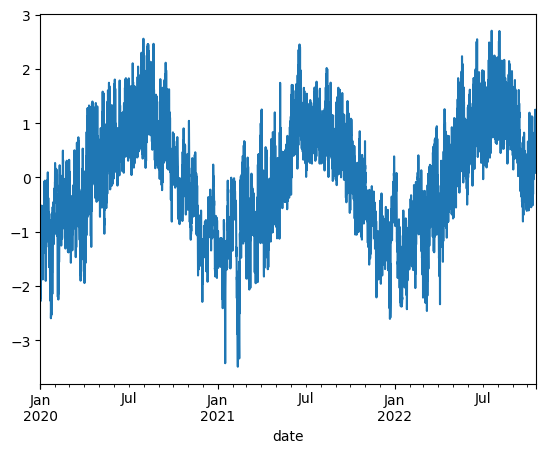

In [ ]:
yeojohnson_y_train["temperature_2m_yeojohnson"].plot()

<Axes: xlabel='date'>

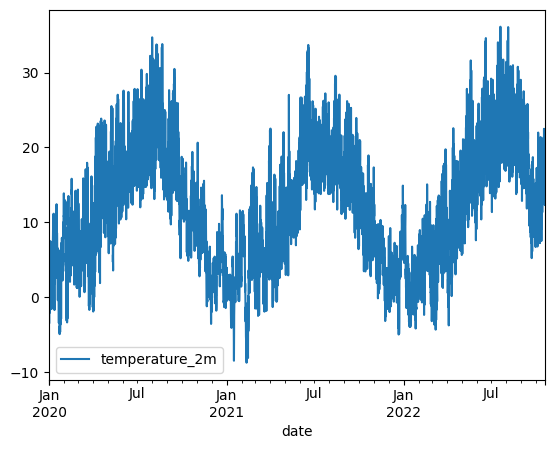

In [ ]:
y_train.plot()

No difference, the variance is not more homogeneous visually.

## Regular Differencing

stabilizing the mean and reducing trends

### DF1

<Axes: xlabel='date'>

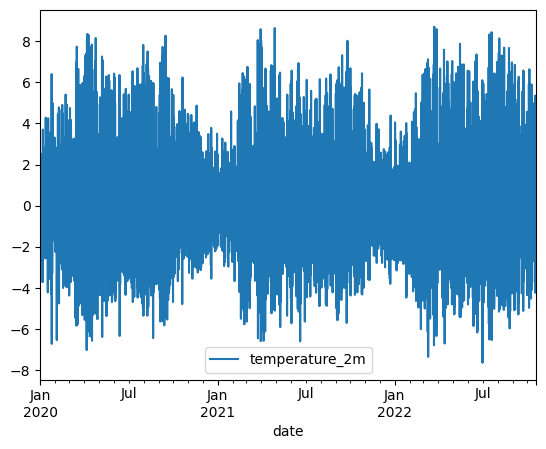

In [ ]:
ts_diff_y_train = (y_train - y_train.shift(1))[1:]
ts_diff_y_train.plot()

In [ ]:
check_adf_stat(ts_diff_y_train)
print("*"*40)
check_kpss_stat(ts_diff_y_train)

The Augmented Dickey-Fuller test results          
  test statistic -20.831,          
  p-value: 0.000          
  critical values: {'1%': -3.4311533111384453, '5%': -2.8618950068229934, '10%': -2.5669589653639764}
There is no unit roots
The time series is stationary
****************************************
The KPSS test results        
  test statistic 0.041,        
  p-value: 0.100        
  critical values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The time series is stationary


### DF2
Twice differencing for further ACF and PACF plots analysis

<Axes: xlabel='date'>

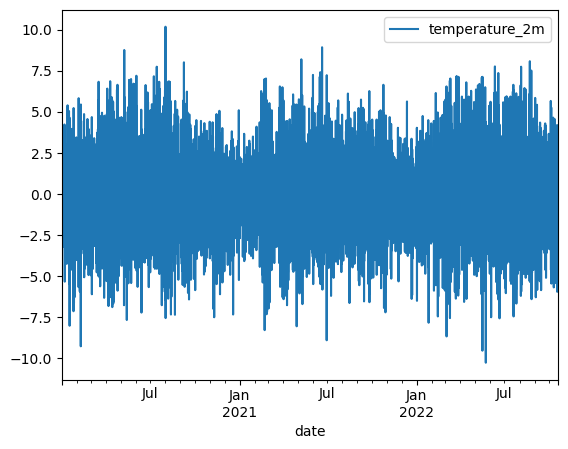

In [ ]:
ts_2diff_y_train = (ts_diff_y_train - ts_diff_y_train.shift(1))[1:]
ts_2diff_y_train.plot()

In [ ]:
check_adf_stat(ts_2diff_y_train)
print("*"*40)
check_kpss_stat(ts_2diff_y_train)

The Augmented Dickey-Fuller test results          
  test statistic -26.350,          
  p-value: 0.000          
  critical values: {'1%': -3.431153409832208, '5%': -2.861895050432774, '10%': -2.566958988577896}
There is no unit roots
The time series is stationary
****************************************
The KPSS test results        
  test statistic 0.018,        
  p-value: 0.100        
  critical values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The time series is stationary


This could be sufficient but we want to treat the seasons.

## Seasonal differencing



#### Daily pattern

From the figure we can see that we have one pattern repeated every day. Let's calculate the time_step

In [ ]:
hours_per_day = 24
frequency_data = 3 # every 3 hours
time_step_day = int(hours_per_day / frequency_data )

time_step_day




8

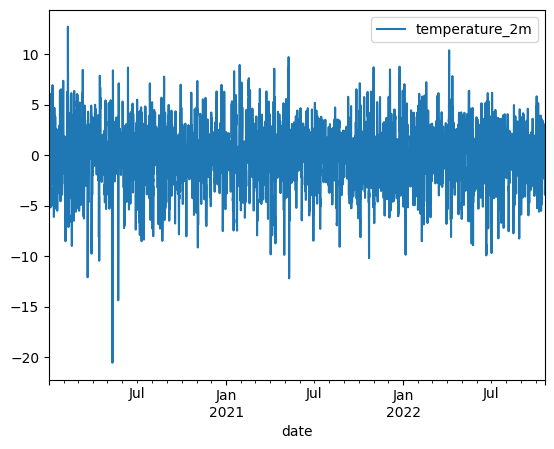

In [ ]:
s = time_step_day
s_d_y_train = (y_train - y_train.shift(s))[s:]
s_d_y_train.dropna(inplace=True)
s_d_y_train.plot();

In [ ]:
check_adf_stat(s_d_y_train)
print("*"*40)
check_kpss_stat(s_d_y_train)

The Augmented Dickey-Fuller test results          
  test statistic -18.384,          
  p-value: 0.000          
  critical values: {'1%': -3.431154002504425, '5%': -2.8618953123166215, '10%': -2.566959127981275}
There is no unit roots
The time series is stationary
****************************************
The KPSS test results        
  test statistic 0.030,        
  p-value: 0.100        
  critical values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The time series is stationary


We see here that we do not need regular differencing, and that removing the daily seasonality is sufficient to treat non stationarity.

#### Yearly pattern

In [ ]:
days_per_year = 365
hours_per_year = hours_per_day * days_per_year
time_step_year = int(hours_per_year / frequency_data)


time_step_year

2920

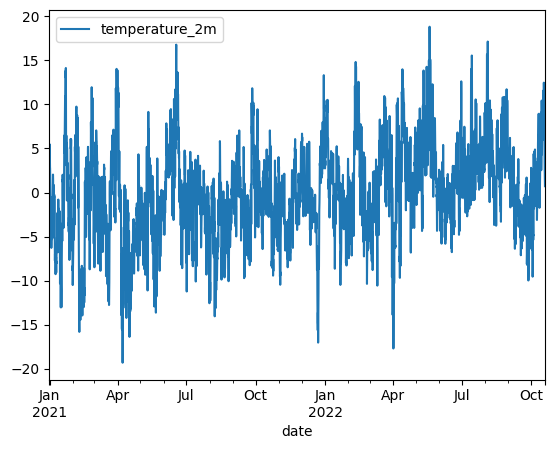

In [ ]:
s = time_step_year
s_y_y_train = (y_train - y_train.shift(s))[s:]
s_y_y_train.dropna(inplace=True)
s_y_y_train.plot();

In [ ]:
# Check again for stationnarity
check_adf_stat(s_y_y_train)
print("*"*40)
check_kpss_stat(s_y_y_train)

The Augmented Dickey-Fuller test results          
  test statistic -7.348,          
  p-value: 0.000          
  critical values: {'1%': -3.4316014372024277, '5%': -2.8620930052285543, '10%': -2.567064364441308}
There is no unit roots
The time series is stationary
****************************************
The KPSS test results        
  test statistic 2.493,        
  p-value: 0.010        
  critical values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The time series is NOT stationary


Treating just the yearly seasonality is not sufficient.




### Daily + Yearly

## Other combinations

We will now create some other combinations of the time series in order to see in which way we can better see the parameters in the ACF and PACF plots

### Diff + Daily S

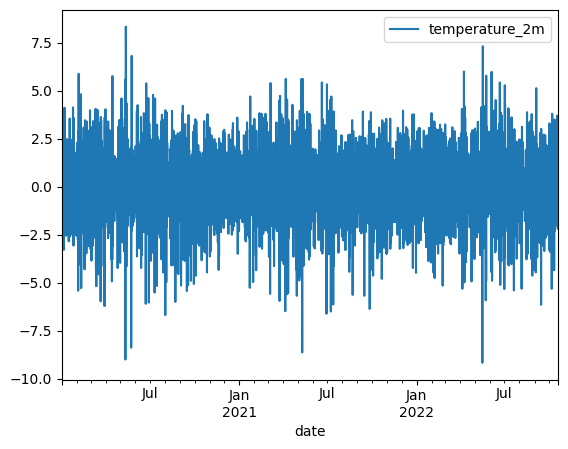

In [ ]:
s = time_step_day
s_d_ts_diff_y_train = (ts_diff_y_train - ts_diff_y_train.shift(s))[s:]
s_d_ts_diff_y_train.dropna(inplace=True)
s_d_ts_diff_y_train.plot();

In [ ]:
check_adf_stat(s_d_ts_diff_y_train)
print("*"*40)
check_kpss_stat(s_d_ts_diff_y_train)

The Augmented Dickey-Fuller test results          
  test statistic -27.187,          
  p-value: 0.000          
  critical values: {'1%': -3.431153804849885, '5%': -2.8618952249790905, '10%': -2.566959081490637}
There is no unit roots
The time series is stationary
****************************************
The KPSS test results        
  test statistic 0.001,        
  p-value: 0.100        
  critical values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The time series is stationary


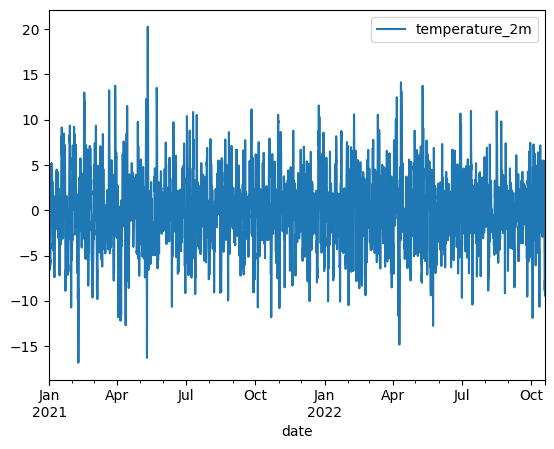

In [ ]:
s = time_step_year
s_y_s_d_y_train = (s_d_y_train - s_d_y_train.shift(s))[s:]
s_y_s_d_y_train.dropna(inplace=True)
s_y_s_d_y_train.plot();

In [ ]:
check_adf_stat(s_y_s_d_y_train)
print("*"*40)
check_kpss_stat(s_y_s_d_y_train)

The Augmented Dickey-Fuller test results          
  test statistic -15.143,          
  p-value: 0.000          
  critical values: {'1%': -3.431603356058229, '5%': -2.862093852984781, '10%': -2.5670648157322997}
There is no unit roots
The time series is stationary
****************************************
The KPSS test results        
  test statistic 0.009,        
  p-value: 0.100        
  critical values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The time series is stationary


### Diff + Daily + Yearly

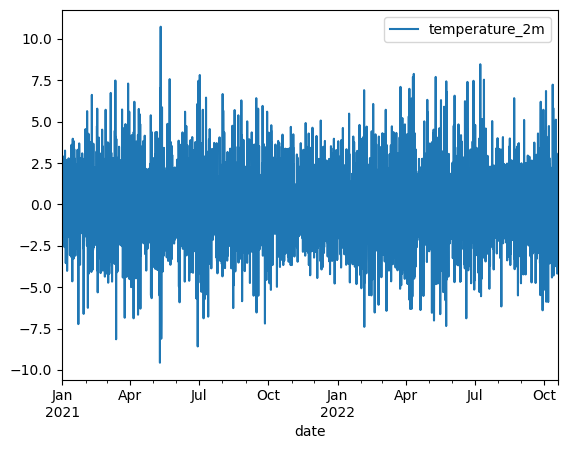

In [ ]:
s = time_step_year
s_y_s_d_diff_y_train = (s_d_ts_diff_y_train - s_d_ts_diff_y_train.shift(s))[s:]
s_y_s_d_diff_y_train.dropna(inplace=True)
s_y_s_d_diff_y_train.plot();


In [ ]:
check_adf_stat(s_y_s_d_diff_y_train)
print("*"*40)
check_kpss_stat(s_y_s_d_diff_y_train)

The Augmented Dickey-Fuller test results          
  test statistic -21.595,          
  p-value: 0.000          
  critical values: {'1%': -3.4316035963290337, '5%': -2.862093959137102, '10%': -2.5670648722409877}
There is no unit roots
The time series is stationary
****************************************
The KPSS test results        
  test statistic 0.003,        
  p-value: 0.100        
  critical values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The time series is stationary


### Diff + Yeo Johnson

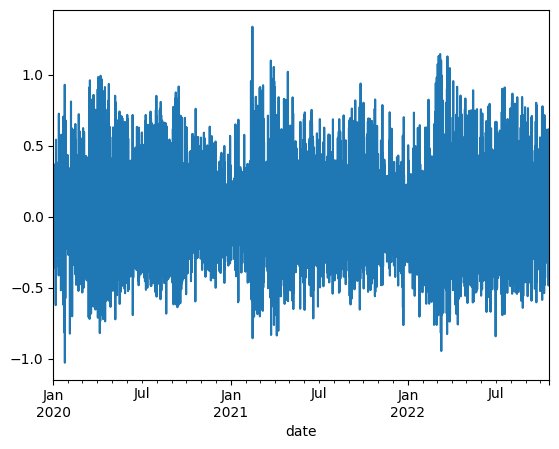

In [ ]:
diff_yeojohnson_y_train = (yeojohnson_y_train["temperature_2m_yeojohnson"] - yeojohnson_y_train["temperature_2m_yeojohnson"].shift(1))
diff_yeojohnson_y_train.dropna(inplace=True)
diff_yeojohnson_y_train.plot();

In [ ]:
check_adf_stat(diff_yeojohnson_y_train)
print("*"*40)
check_kpss_stat(diff_yeojohnson_y_train)

The Augmented Dickey-Fuller test results          
  test statistic -20.566,          
  p-value: 0.000          
  critical values: {'1%': -3.4311533111384453, '5%': -2.8618950068229934, '10%': -2.5669589653639764}
There is no unit roots
The time series is stationary
****************************************
The KPSS test results        
  test statistic 0.031,        
  p-value: 0.100        
  critical values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The time series is stationary


# Identifying hyperparameters p,d,q and P, D, Q

### Plots

Identify  p  and  q  values for ARIMA (SARIMAX) using ACF and PACF plots.

The value ranges for these parameters include all values from 0 to the lag corresponded to the last significant value within the period (the lag of the period itself is not taken into account).

#### Autocorrelation Function (ACF)

In [ ]:
import statsmodels.graphics.tsaplots as tsaplots

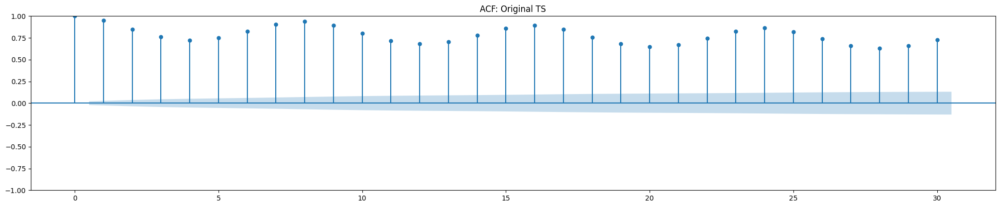

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_acf(y_train, lags=30, ax=ax1, title='ACF: Original TS');

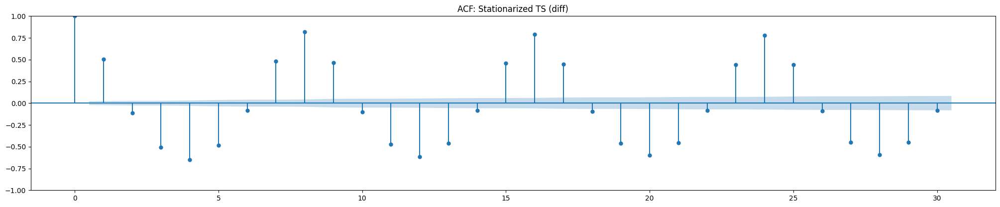

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_acf(ts_diff_y_train, lags=30, ax=ax1, title='ACF: Stationarized TS (diff)');

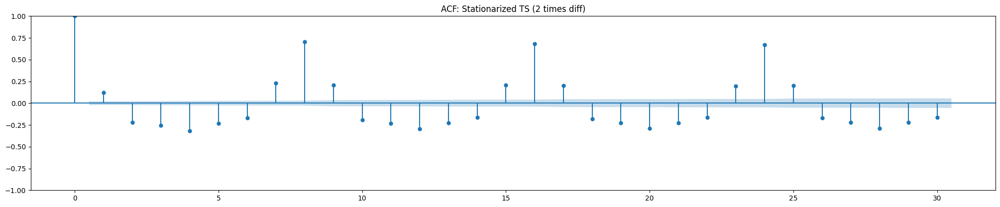

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_acf(ts_2diff_y_train, lags=30, ax=ax1, title='ACF: Stationarized TS (2 times diff)');

These first ACF plots confirm our theory of a season of 8 steps (A day) s=8

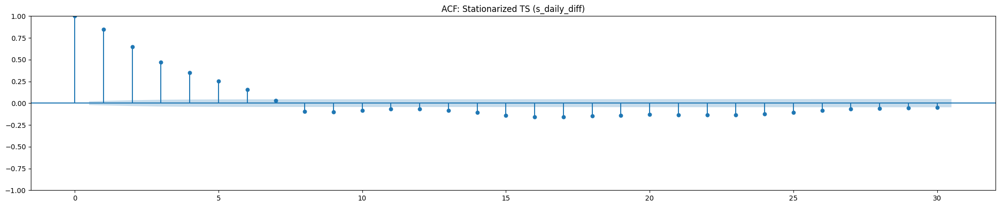

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_acf(s_d_y_train, lags=30, ax=ax1, title='ACF: Stationarized TS (s_daily_diff)');

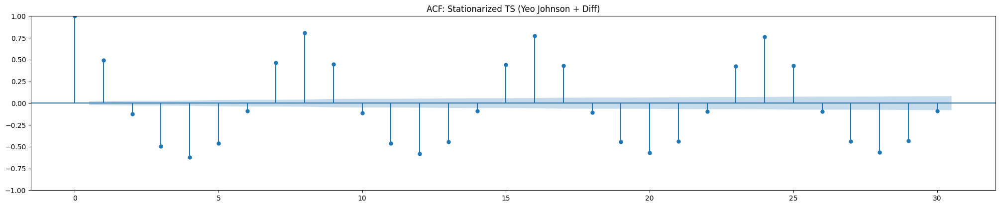

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_acf(diff_yeojohnson_y_train, lags=30, ax=ax1, title='ACF: Stationarized TS (Yeo Johnson + Diff)');

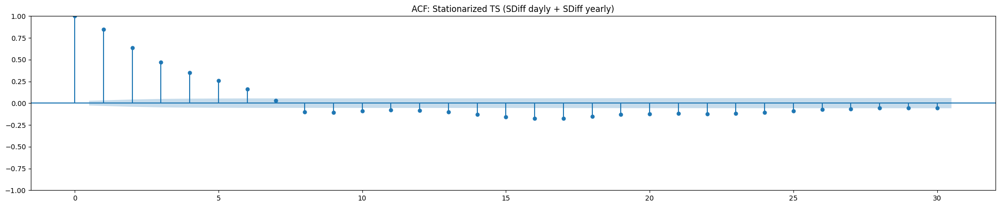

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_acf(s_y_s_d_y_train, lags=30, ax=ax1, title='ACF: Stationarized TS (SDiff dayly + SDiff yearly)');

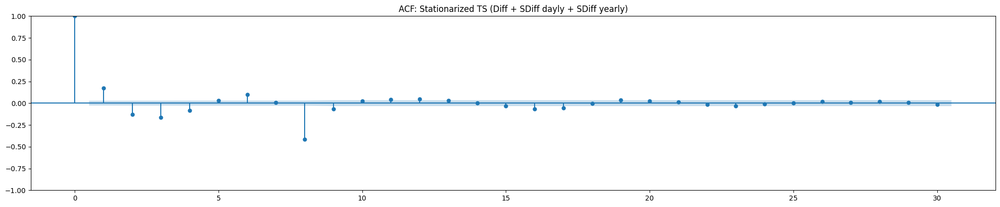

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_acf(s_y_s_d_diff_y_train, lags=30, ax=ax1, title='ACF: Stationarized TS (Diff + SDiff dayly + SDiff yearly)');

There is no big difference between the graph before and the next one. As the amount of differencing shouldn't be too high, we will use ACF: Stationarized TS (diff+ s_daily_diff): s_d_ts_diff_y_train

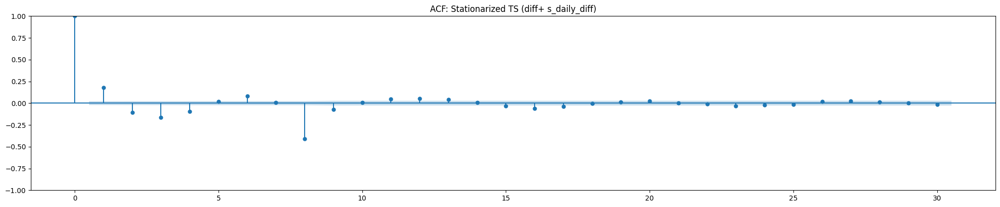

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_acf(s_d_ts_diff_y_train, lags=30, ax=ax1, title='ACF: Stationarized TS (diff+ s_daily_diff)');

**Used graph: ACF: Stationarized TS (diff+ s_daily_diff)**

    
the coefficiants are significant up until lag 9, and then they fall into the non-significance zone (shaded area) of the plot.
There are some significant coefficients around lag 15 but likely due to chance as they are non-significant between the lags before and after. So we have a moving average process of order q=8.

For Q we can use 0 and 1 : the coefficients are significantly up until lag 1 * s at t=8.  
Later, we will loop through those ranges to find the best combination.


In [ ]:
q_values = range(0,9)

In [ ]:
Q_values = range(0,2)

#### Partial Auto correlation function (PACF)

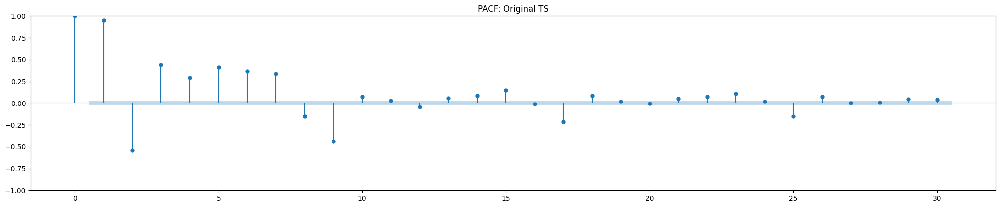

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_pacf(y_train, lags=30, ax=ax1, title='PACF: Original TS');

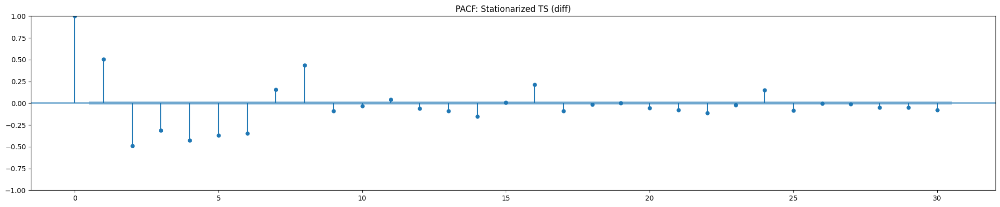

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_pacf(ts_diff_y_train, lags=30, ax=ax1, title='PACF: Stationarized TS (diff)');

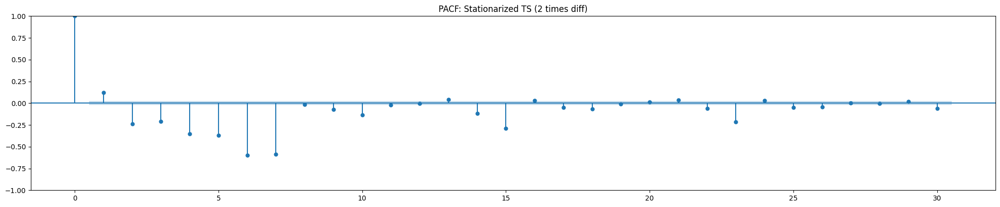

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_pacf(ts_2diff_y_train, lags=30, ax=ax1, title='PACF: Stationarized TS (2 times diff)');

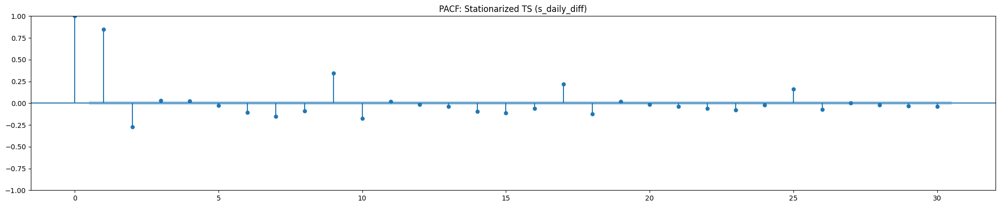

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_pacf(s_d_y_train, lags=30, ax=ax1, title='PACF: Stationarized TS (s_daily_diff)');

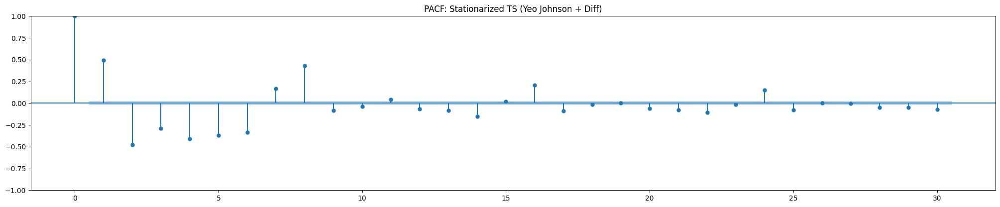

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_pacf(diff_yeojohnson_y_train, lags=30, ax=ax1, title='PACF: Stationarized TS (Yeo Johnson + Diff)');

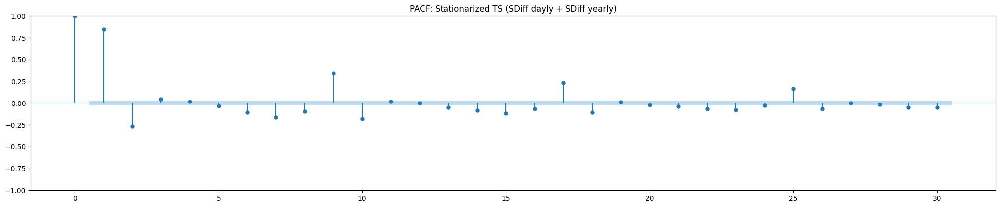

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_pacf(s_y_s_d_y_train, lags=30, ax=ax1, title='PACF: Stationarized TS (SDiff dayly + SDiff yearly)');

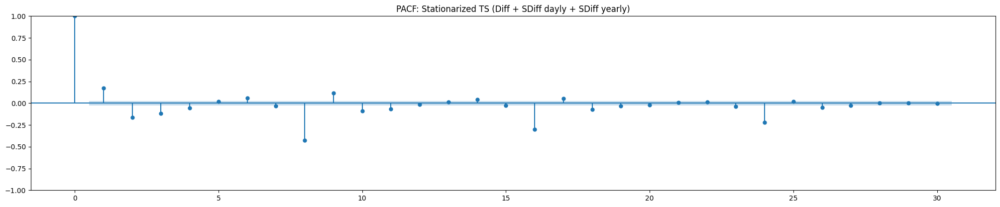

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_pacf(s_y_s_d_diff_y_train, lags=30, ax=ax1, title='PACF: Stationarized TS (Diff + SDiff dayly + SDiff yearly)');

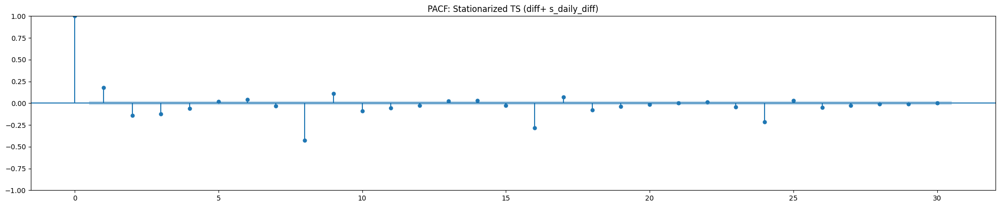

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_pacf(s_d_ts_diff_y_train, lags=30, ax=ax1, title='PACF: Stationarized TS (diff+ s_daily_diff)');

This plot shows significantly negative lags which can mean that i have over differenced the data. As the objective is to produce the most accurate forecast, it is not important here to select lag orders such that PACF plot shows no signifcant lag remaining.
  
I will use the range 0 to 11 for p.

    
For P, the coeficients are significantly up until lag 3 * s at least: 8, 16, 24. Let's check with a plot being bigger

In [ ]:
p_values = range(0,11)

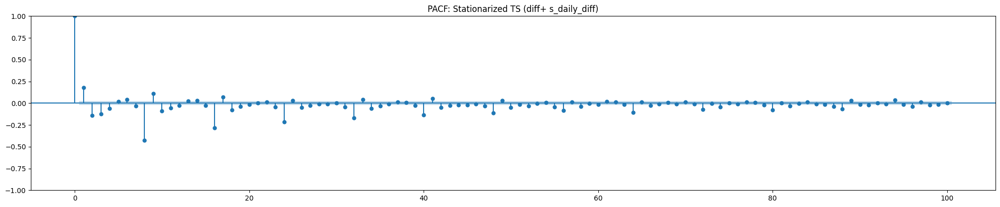

In [ ]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(211)
fig = tsaplots.plot_pacf(s_d_ts_diff_y_train, lags=100, ax=ax1, title='PACF: Stationarized TS (diff+ s_daily_diff)');

It seems that we have significant lags until lag 80-something. But we can not loop through so many, so we will use P unitl lag 40 so the values of P will be 1 to 5.  

For D we will test 0, 1

In [ ]:
P_values = range(0,6 )
D_values = range(0,2)

# ARIMA

In [ ]:
# d is the number of differencing operations, we saw that d=1 made the series stationnary. We will use a range 0 to 2
d_values = range(0,2)


best_score_aic: This variable is initialized with positive infinity (float("inf")) to keep track of the best AIC score found during the model selection process.
best_cfg_aic: This variable is initialized as None to store the order (p,d,q) that corresponds to the best AIC score found.

For each combination of parameters, an ARIMA model is instantiated and fit to the training data (y_train). If the model converges successfully, its AIC score is calculated.

If the AIC score of the current model is lower than the previously recorded best AIC score (best_score_aic), the current model's AIC score and order are updated as the best so far.
At the end of the nested loops, the best model configuration (i.e., the one with the lowest AIC score) is printed.

❗First I forgot to change the time zone. But because of the execution duration i just re executed the next code cell. As the difference is not significative, I didn't re-execute the others. For the ML models, data with the correct time zone is used.

❗ARIMA expects data that is either not seasonal or has the seasonal component removed. I forgot that.

In [ ]:

best_score_aic, best_cfg_aic = float("inf"), None
# aic = Akaike Information Criteria = quantifies the relative amount of information lost by the model
# cfg = order configuration

for p in p_values:
    for d in d_values:
        for q in q_values:
            order = (p,d,q)
            try:
                model = ARIMA(y_train, order=order).fit()
                if model.aic < best_score_aic:
                    best_score_aic, best_cfg_aic = model.aic, order
                    print(f'ARIMA{order} AIC={model.aic:.3f}')
            except:
                continue

print(f'Best ARIMA{best_cfg_aic} AIC={best_score_aic:.3f}')

ARIMA(0, 0, 0) AIC=57347.151
ARIMA(0, 0, 1) AIC=47650.201
ARIMA(0, 0, 2) AIC=41028.865
ARIMA(0, 0, 3) AIC=37208.097
ARIMA(0, 0, 4) AIC=35605.476
ARIMA(0, 0, 5) AIC=35553.737
ARIMA(0, 0, 6) AIC=33166.922
ARIMA(0, 0, 7) AIC=33120.563
ARIMA(0, 0, 8) AIC=33102.065
ARIMA(0, 1, 4) AIC=32472.804
ARIMA(0, 1, 5) AIC=32445.178
ARIMA(0, 1, 6) AIC=31944.894
ARIMA(0, 1, 7) AIC=31874.833
ARIMA(0, 1, 8) AIC=30936.843
ARIMA(1, 0, 8) AIC=30887.092
ARIMA(1, 1, 8) AIC=30720.256
ARIMA(2, 0, 8) AIC=30639.218
ARIMA(2, 1, 2) AIC=29440.410
ARIMA(2, 1, 3) AIC=29349.533
ARIMA(2, 1, 4) AIC=28483.746
ARIMA(2, 1, 5) AIC=28435.271
ARIMA(2, 1, 6) AIC=28427.678
ARIMA(2, 1, 8) AIC=28406.052
ARIMA(3, 1, 5) AIC=28352.379
ARIMA(3, 1, 6) AIC=28335.318
ARIMA(3, 1, 8) AIC=28268.775
ARIMA(4, 1, 4) AIC=26815.658
ARIMA(4, 1, 7) AIC=26771.515
ARIMA(5, 1, 7) AIC=26750.820
ARIMA(5, 1, 8) AIC=26738.731
ARIMA(6, 0, 8) AIC=26728.635
ARIMA(6, 1, 7) AIC=25821.273
ARIMA(6, 1, 8) AIC=25652.411
ARIMA(7, 1, 8) AIC=25646.472
ARIMA(8, 0, 6)

In [ ]:
best_cfg_aic = (9, 1, 8)
best_score_aic = 25441.505

In [ ]:
def plot_forecast(y_train, y_test, pred_test, model_name, score):
    plt.figure(figsize=(25,10))
    plt.plot(y_train.index, y_train.values, label='train and validation')
    plt.plot(y_test.index, y_test.values, label='test')
    plt.plot(y_test.index, pred_test, label='predicted')
    plt.legend(loc='best')
    plt.title(f'RMSE: {score} - Model Forecast: {model_name}')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.show()

## Predictions using ARIMA best order

In [ ]:
all_results = []

In [ ]:
df_arima = get_data(url, params,["temperature_2m"])
df_arima.head()

,temperature_2m
date,
2019-12-31 21:00:00+00:00,-3.227000
2020-01-01 00:00:00+00:00,-2.218667
2020-01-01 03:00:00+00:00,-3.085334
2020-01-01 06:00:00+00:00,-3.518667
2020-01-01 09:00:00+00:00,-1.985333


In [ ]:
# Split the data into features and target
X_arima = df_arima.drop(columns=["temperature_2m"])
y_arima = df_arima[['temperature_2m']]

In [ ]:
X_arima_train, X_arima_val, X_arima_test, y_arima_train, y_arima_val, y_arima_test = split_data_time(X_arima, y_arima, train_size, val_size)
X_arima_train.shape, X_arima_val.shape, X_arima_test.shape, y_arima_train.shape, y_arima_val.shape, y_arima_test.shape

((8182, 0), (1753, 0), (1754, 0), (8182, 1), (1753, 1), (1754, 1))

In [ ]:
y_arima_train_val = pd.concat([y_arima_train, y_arima_val], axis=0)
X_arima_train_val = pd.concat([X_arima_train, X_arima_val], axis=0)

In [ ]:
# Train the ARIMA model
model_arima = ARIMA(y_arima_train_val, order=best_cfg_aic).fit()

# Predict using the ARIMA model
pred_test_arima = model_arima.predict(start=X_arima_test.index[0], end=X_arima_test.index[-1])

# Calculate RMSE for test set
rmse_test_arima = mean_squared_error(y_arima_test, pred_test_arima, squared=False)

# Get AIC for the trained model
aic_arima = model_arima.aic

# Print results
print(f'ARIMA{order}\nAIC={aic_arima:.2f}\nRMSE (test)={rmse_test_arima:.2f}')


ARIMA(4, 1, 7)
AIC=30602.64
RMSE (test)=7.31


#### Plot

In [ ]:
all_results.append({'name': "ARIMA", 'rmse': rmse_test_arima})

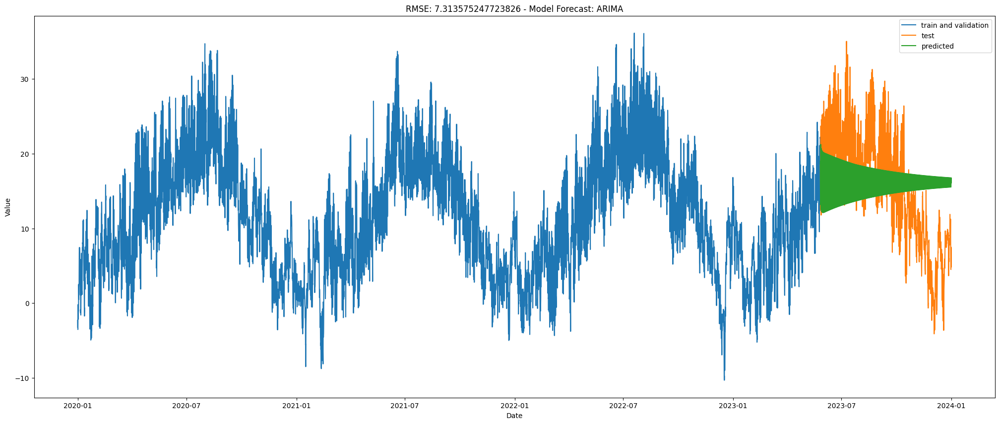

In [ ]:
plot_forecast(y_arima_train_val, y_arima_test,pred_test_arima, "ARIMA", rmse_test_arima)

As I forgot to use seasonal differenced data for ARIMA, i am not surprised by the shape of the predictions

## Figuring P, D, Q for SARIMAX using ARIMA best order

In [ ]:
best_cfg_aic = (9, 1, 8)

In [ ]:
best_score_aic_sarimax1 , best_cfg_aic_sarimax1 = float("inf"), None

for P in P_values:
    for D in D_values:
        for Q in Q_values:
            seasonal_order=(P, D, Q, s)
            try:
                model = SARIMAX(y_train, order=best_cfg_aic, seasonal_order=seasonal_order).fit()
                if model.aic < best_score_aic_sarimax1:
                    best_score_aic_sarimax1, best_cfg_aic_sarimax1 = model.aic, seasonal_order
                    print(f'SARIMAX{order}{seasonal_order} AIC={model.aic:.3f}')
            except:
                continue

print(f'Best SARIMAX({order})({best_cfg_aic_sarimax1}) AIC={best_score_aic_sarimax1:.3f}')

SARIMAX(4, 1, 7)(0, 0, 0, 8) AIC=25450.268
SARIMAX(4, 1, 7)(0, 1, 0, 8) AIC=25169.346
Best SARIMAX((4, 1, 7))((0, 1, 0, 8)) AIC=25169.346


# SARIMA

Like Sarimax but without external (exogenous) variables

## Figuring out p, d, q

In [ ]:
best_score_aic_sarima , best_cfg_aic_sarima = float("inf"), None
# aic = Akaike Information Criteria = quantifies the relative amount of information lost by the model
# cfg = order configuration

for p in p_values:
    for d in d_values:
        for q in q_values:
            order = (p,d,q)
            try:
                model = SARIMAX(y_train, order=order).fit()
                if model.aic < best_score_aic_sarima:
                    best_score_aic_sarima, best_cfg_aic_sarima = model.aic, order
                    print(f'SARIMA{order} AIC={model.aic:.3f}')
            except:
                continue

print(f'Best SARIMA{best_cfg_aic_sarima} AIC={best_score_aic_sarima:.3f}')

SARIMA(0, 0, 0) AIC=67003.780
SARIMA(0, 0, 1) AIC=56604.895
SARIMA(0, 0, 2) AIC=48295.238
SARIMA(0, 0, 3) AIC=43170.513
SARIMA(0, 0, 4) AIC=42246.794
SARIMA(0, 0, 5) AIC=38959.230
SARIMA(0, 0, 6) AIC=35728.915
SARIMA(0, 0, 7) AIC=35095.413
SARIMA(0, 0, 8) AIC=34970.232
SARIMA(0, 1, 2) AIC=34795.142
SARIMA(0, 1, 3) AIC=33872.436
SARIMA(0, 1, 4) AIC=32473.427
SARIMA(0, 1, 5) AIC=32445.706
SARIMA(0, 1, 6) AIC=31945.440
SARIMA(0, 1, 7) AIC=31875.231
SARIMA(0, 1, 8) AIC=30939.326
SARIMA(1, 0, 8) AIC=30932.428
SARIMA(1, 1, 8) AIC=30722.610
SARIMA(2, 0, 8) AIC=30708.092
SARIMA(2, 1, 2) AIC=29440.309
SARIMA(2, 1, 3) AIC=29349.236
SARIMA(2, 1, 4) AIC=28483.571
SARIMA(2, 1, 5) AIC=28435.654
SARIMA(2, 1, 6) AIC=28427.480
SARIMA(2, 1, 8) AIC=28405.950
SARIMA(3, 1, 5) AIC=28351.277
SARIMA(3, 1, 6) AIC=28339.992
SARIMA(3, 1, 8) AIC=28268.446
SARIMA(4, 1, 4) AIC=26813.151
SARIMA(4, 1, 7) AIC=26796.150
SARIMA(5, 0, 1) AIC=14.000
Best SARIMA(5, 0, 1) AIC=14.000


## Figuring out P, D, Q for SARIMAX using SARIMA best order

Even though the best order here seems to be 5, 0, 1, we will not use it, because there seems to be a convergance issue. We will use the values before 4, 1, 7.
Now we will be figuring out P, D, Q using order find for SARIMA

In [ ]:
best_cfg_aic_sarima = (4,1,7)
best_score_aic_sarima = 26796.150

In [ ]:
s = time_step_day

In [ ]:
print(s)
print(P_values) # i reduced the number of P because of limitations
print(D_values)
print(Q_values)

8
range(0, 6)
range(0, 2)
range(0, 2)


In [ ]:
order = (best_cfg_aic_sarima)
best_score_aic_sarimax, best_cfg_aic_sarimax = float("inf"), None

In [ ]:
order

(4, 1, 7)

In [ ]:

for P in P_values:
    for D in D_values:
        for Q in Q_values:
            seasonal_order=(P, D, Q, s)
            try:
                model = SARIMAX(y_train, order=order, seasonal_order=seasonal_order).fit()
                if model.aic < best_score_aic_sarimax:
                    best_score_aic_sarimax, best_cfg_aic_sarimax = model.aic, seasonal_order
                    print(f'SARIMAX{order}{seasonal_order} AIC={model.aic:.3f}')
            except:
                continue

print(f'Best SARIMAX({order})({best_cfg_aic_sarimax}) AIC={best_score_aic_sarimax:.3f}')

SARIMAX(4, 1, 7)(0, 0, 0, 8) AIC=26796.150
SARIMAX(4, 1, 7)(0, 1, 0, 8) AIC=26249.645
SARIMAX(4, 1, 7)(0, 1, 1, 8) AIC=25255.302
SARIMAX(4, 1, 7)(1, 0, 1, 8) AIC=25229.008
SARIMAX(4, 1, 7)(1, 1, 1, 8) AIC=25074.855
Best SARIMAX((4, 1, 7))((1, 1, 1, 8)) AIC=25074.855


So we found the best Sarimax with ((4, 1, 7))((1, 1, 1, 8)).

In [ ]:
best_seasonal_order = (1, 1, 1, 8)
best_order = (4, 1, 7)
best_score_aic_sarimax = 25074.855

## Predictions using SARIMA best order

❗Here i forgot to include the seasonal order in sarima

In [ ]:
sarima_order = (4, 1, 7)

In [ ]:
# Train the ARIMA model
model_sarima = SARIMAX(y_arima_train_val, order=sarima_order).fit()

# Predict using the ARIMA model
pred_test_sarima = model_sarima.predict(start=X_arima_test.index[0], end=X_arima_test.index[-1])

# Calculate RMSE for test set
rmse_test_sarima = mean_squared_error(y_arima_test, pred_test_sarima, squared=False)

# Get AIC for the trained model
aic_sarima = model_sarima.aic

# Print results
print(f'SARIMA{order}\nAIC={aic_arima:.2f}\nRMSE (test)={rmse_test_sarima:.2f}')

SARIMA(4, 1, 7)
AIC=30602.64
RMSE (test)=7.72


## Plot Predictions

In [ ]:
all_results.append({'name': "SARIMA", 'rmse': rmse_test_sarima})

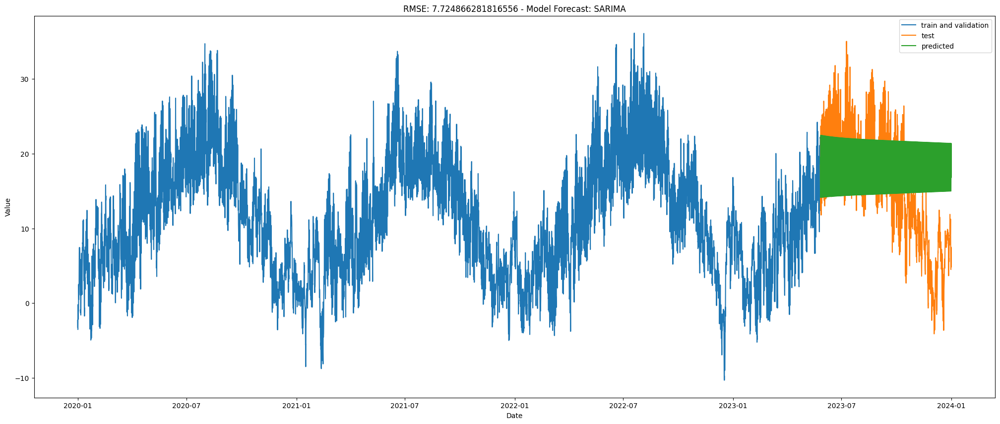

In [ ]:
plot_forecast(y_arima_train_val, y_arima_test, pred_test_sarima, "SARIMA", rmse_test_sarima)

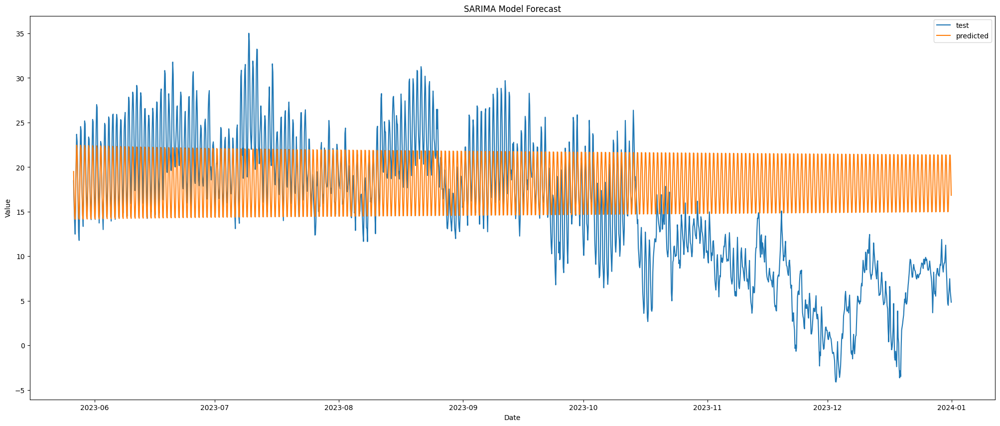

In [ ]:
plt.figure(figsize=(25, 10))
#plt.plot(y_arima_train_val.index, y_arima_train_val.values, label='train and validation')
plt.plot(y_test.index, y_test.values, label='test')
plt.plot(pred_test_sarima.index, pred_test_sarima.values, label='predicted')
plt.legend(loc='best')
plt.title('SARIMA Model Forecast')
plt.xlabel('Date')
plt.ylabel('Value')
plt.show()

In [ ]:
Here i forgot to include the seasonal order, but it seems that Sarima still recognized a daily seasonality. But it is weird that it predicts thee same temperature range for all the days

# SARIMAX


## Data Preparation

I decided to use the dew_point at 2m (point de rosée), which is basically the temperature at which the air is will condense to form liquid water known as dew (la rosée).

In [ ]:
# import one other variable "hourly": "dew_point_2m"
url = "https://archive-api.open-meteo.com/v1/archive"
params = { # Strasbourg
	"latitude": 48.5839,
	"longitude": 7.7455,
	"start_date": "2020-01-01",
	"end_date": "2023-12-31",
	"hourly": ["temperature_2m", "dew_point_2m"],
	"timezone": "Europe/Berlin"
}

In [ ]:
df = get_data(url, params,["temperature_2m", "dew_point_2m"])
df.head()

,temperature_2m,dew_point_2m
date,,
2019-12-31 21:00:00+00:00,-3.227000,-4.252000
2020-01-01 00:00:00+00:00,-2.218667,-2.518667
2020-01-01 03:00:00+00:00,-3.085334,-3.302000
2020-01-01 06:00:00+00:00,-3.518667,-3.818667
2020-01-01 09:00:00+00:00,-1.985333,-2.485333


In [ ]:
# Split the data into features and target
X = df[["dew_point_2m"]]
y = df[['temperature_2m']]

In [ ]:
X_train, X_val, X_test, y_train, y_val, y_test = split_data_time(X, y, train_size, val_size)

In [ ]:
def preprocess_dew_(X):
    res = pd.DataFrame(X.copy())

    # Apply MinMaxScaler to the 'dew_point_2m' column
    scaler = MinMaxScaler(feature_range=(0, 1))
    res['dew_point_2m_normalized'] = scaler.fit_transform(res[['dew_point_2m']])
    res = res.drop(columns=['dew_point_2m'])

    return res

In [ ]:
X_train = preprocess_dew_(X_train)
X_test = preprocess_dew_(X_test)
X_val = preprocess_dew_(X_val)

In [ ]:
y_train_val = pd.concat([y_train,y_val], axis=0)
X_train_val = pd.concat([X_train, X_val], axis=0)


## SARIMAX (Date + dew_point_2m_temperature) using ARIMA best Order

In [ ]:
# Selon ARIMA
arima_best_order = (4,1,7)
arima_best_seasonal_order = (0, 1, 0, 8)


In [ ]:
# Train the SARIMAX model with exogenous variables
model_sarimax_exog = SARIMAX(endog=y_train_val['temperature_2m'], exog=X_train_val['dew_point_2m_normalized'], order=arima_best_order, seasonal_order=arima_best_seasonal_order).fit()

In [ ]:
# Predict using the SARIMAX model with exogenous variables on the validation set
pred_test = model_sarimax_exog.predict(start=X_test.index[0], end=X_test.index[-1], exog=X_test['dew_point_2m_normalized'])

# Calculate RMSE for test set
rmse_test = mean_squared_error(y_test, pred_test, squared=False)

# Get AIC for the trained model
aic = model_sarimax_exog.aic

# Print results
print(f'SARIMAX{order}{seasonal_order}\nAIC={aic:.2f}\nRMSE (test)={rmse_test:.2f}')


SARIMAX(10, 1, 8)(5, 1, 1, 8)
AIC=31279.03
RMSE (test)=19.69


### Plot

In [ ]:
all_results.append({'name': "SARIMAX - Arima best order", 'rmse': 19.69})

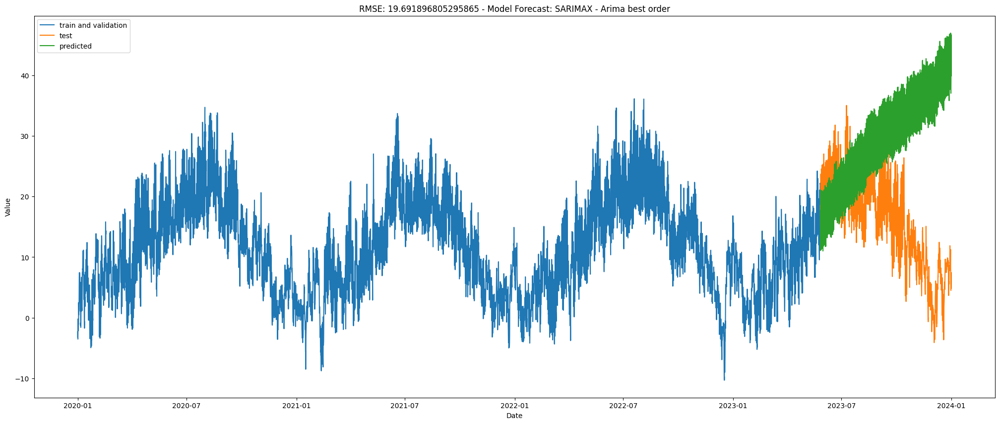

In [ ]:
plot_forecast(y_train_val, y_test, pred_test, "SARIMAX - Arima best order", rmse_test)

This shows that SARIMAX didnt understand the yearly seasonality, as we dont include it.

## SARIMAX (Date + dew_point_2m_temperature) using SARIMA best order

In [ ]:
# Selon SARIMA
sarima_best_order = (4, 1, 7)
sarima_best_seasonal_order = (1, 1, 1, 8)

In [ ]:
# Train the SARIMAX model with exogenous variables
model_sarimax_exog2 = SARIMAX(endog=y_train_val['temperature_2m'], exog=X_train_val['dew_point_2m_normalized'], order=sarima_best_order, seasonal_order=sarima_best_seasonal_order).fit()

In [ ]:
# Predict using the SARIMAX model with exogenous variables on the validation set
pred_test = model_sarimax_exog2.predict(start=X_test.index[0], end=X_test.index[-1], exog=X_test['dew_point_2m_normalized'])

# Calculate RMSE for test set
rmse_test = mean_squared_error(y_test, pred_test, squared=False)

# Get AIC for the trained model
aic = model_sarimax_exog2.aic

# Print results
print(f'SARIMAX{order}{seasonal_order}\nAIC={aic:.2f}\nRMSE (test)={rmse_test:.2f}')


SARIMAX(10, 1, 8)(5, 1, 1, 8)
AIC=29758.37
RMSE (test)=17.95


### Plot

In [ ]:
all_results.append({'name': "SARIMAX - Sarima best order", 'rmse': 17.95})

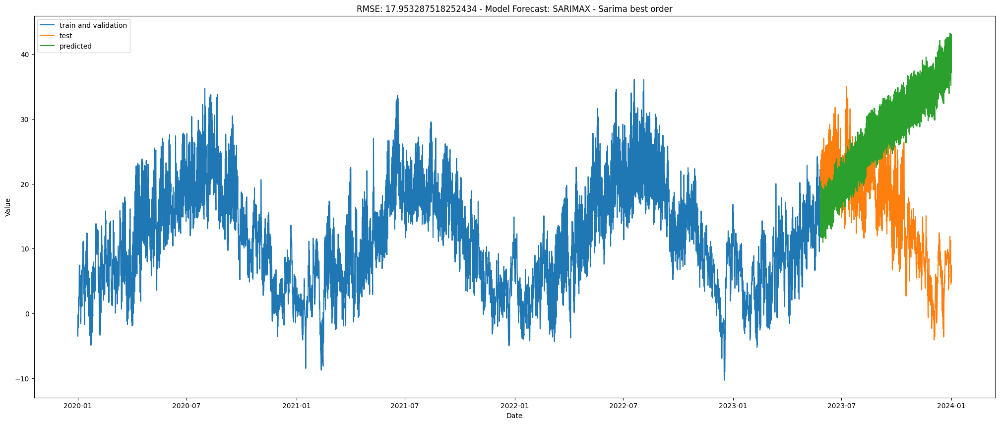

In [ ]:
plot_forecast(y_train_val, y_test, pred_test, "SARIMAX - Sarima best order", rmse_test)

I was not expecting anything else

# Experimentation ML Régression

In this part, I will work on
ML de régression = Linear Regression
variables retardées (lag), variables construites à partir de
valeurs agrégées, variables exogènes (vous pouvez utiliser la même variable que vous aurez
choisie pour SARIMAX).



In [ ]:
ts_data = pd.concat([X, y], axis=1)

In [ ]:
ts_data

,dew_point_2m,temperature_2m
date,,
2019-12-31 21:00:00+00:00,-4.252000,-3.227000
2020-01-01 00:00:00+00:00,-2.518667,-2.218667
2020-01-01 03:00:00+00:00,-3.302000,-3.085334
2020-01-01 06:00:00+00:00,-3.818667,-3.518667
2020-01-01 09:00:00+00:00,-2.485333,-1.985333
...,...,...
2023-12-31 09:00:00+00:00,2.731333,6.481333
2023-12-31 12:00:00+00:00,5.131333,7.481333
2023-12-31 15:00:00+00:00,4.231333,6.081333


## Adding Lags, Agregate values (time of day, month, season and year means) and exogene values (dew_point)

In [ ]:
def create_lags(df, num_lags):
  # Add columns to the dataframe for lags from 1 to num_lags
  for i in range(1, num_lags):
      df[f"lag_{i}"] = df["temperature_2m"].shift(i)

  # Drop rows containing NaN: only first max_lag (7 in this case) rows are concerned.
  # These data cannot be used in a regression model.
  df.dropna(inplace=True)

  return df


In [ ]:
 # the lags contain information about the 7 * 3 = 21 last hours before the prediction. So we can  use this model only for short term prediction.
 # so let's add one yearly lag (which means we will lose one year)

lag_distance_year = int(365*24/3 )

def create_year_lags(df):
  df[f'year_lag_{lag_distance_year}'] = df["temperature_2m"].shift(lag_distance_year)

  df.dropna(inplace=True)

  return df

In [ ]:
def get_season(df):
    date_series = df.index
    seasons = {
        'spring': pd.date_range(start='2018-03-21', end='2018-06-20'),
        'summer': pd.date_range(start='2018-06-21', end='2018-09-22'),
        'autumn': pd.date_range(start='2018-09-23', end='2018-12-20')
    }

    season_series = pd.Series(index=date_series, dtype='object')
    #season_series = date_series
    for season, season_dates in seasons.items():
        season_series[date_series.strftime('%m-%d').isin(season_dates.strftime('%m-%d'))] = season

    season_series.fillna('winter', inplace=True)
    df['season'] = season_series

    return df

In [ ]:
def get_time_of_day(hour):
    times = {
        'morning': [6, 9],
        'day': [12, 15],
        'evening': [18, 21],
        'night': [00, 3]
    }

    for time, hour_range in times.items():
        if hour in hour_range:
            return time
    return None

In [ ]:
def get_time(df):
    date_series = df.index
    time_series = pd.Series(index=date_series, dtype='object')

    for hour in date_series.hour:
        time_of_day = get_time_of_day(hour)
        time_series[date_series.hour == hour] = time_of_day

    time_series.fillna('night', inplace=True)
    df['time_of_day'] = time_series

    return df


In [ ]:
# Function that returns a dictionary where:
# the keys correspond to unique values of `cat_feature`, and
# the values correspond to average values of `real_feature`.
def get_mean_by_cat(data, cat_feature, value_feature):
    return dict(data.groupby(cat_feature)[value_feature].mean())

### Full preprocessing function

In [ ]:
def preprocess_df(df, lag_end=8, date_cut="31.12.2022"):
  data = pd.DataFrame(df.copy())
  data = create_lags(data, lag_end)
  data = create_year_lags(data)
  data["month"] = data.index.month
  data["year"] = data.index.year
  data = get_time(data)
  data = get_season(data)

  # calculate average values only on train data to avoid data leak
  data["month_average"] = list(map(get_mean_by_cat(data.loc[:date_cut], "month", "temperature_2m").get, data.month))
  data["year_average"] = list(map(get_mean_by_cat(data.loc[:date_cut], "year", "temperature_2m").get, data.year))
  data["season_average"] = list(map(get_mean_by_cat(data.loc[:date_cut], "season", "temperature_2m").get, data.season))
  data["time_of_day_average"] = list(map(get_mean_by_cat(data.loc[:date_cut], "time_of_day", "temperature_2m").get, data.time_of_day))

  years_average_mean = data['year_average'].mean()

  data['year_average'].fillna(years_average_mean, inplace=True)

  # drop features used for calculating average values
  data.drop(columns=["month","year", "season", "time_of_day"], axis=1, inplace=True)

  # scale dew_point
  data = preprocess_dew_(data)

  # Split into train and test parts
  X = data.drop(["temperature_2m"], axis=1)
  y = data["temperature_2m"]
  X_train = X.loc[:date_cut]
  y_train = y.loc[:date_cut]
  X_test = X.loc[date_cut:]
  y_test = y.loc[date_cut:]

  return X_train, X_test, y_train, y_test

In [ ]:
X_train, X_test, y_train, y_test = preprocess_df(ts_data)

In [ ]:
X_test.isna().any()

lag_1                      False
lag_2                      False
lag_3                      False
lag_4                      False
lag_5                      False
lag_6                      False
lag_7                      False
year_lag_2920              False
month_average              False
year_average               False
season_average             False
time_of_day_average        False
dew_point_2m_normalized    False
dtype: bool

# Preparing models

I am preparing different X_train and X_test dataframes, with different informations (lags or not, aggregate information or not, exogene data or not, year lag or not). Then for each of these dataframes i'll create a linear regression model and a elastic net model.


In [ ]:
def create_experimentation_dfs(df, lags=False, aggregates=False, exo=False, num_lags=8, year_lag=False):
  df = df.copy()

  if year_lag != True:
    year_lag_column = f'year_lag_{lag_distance_year}'
    if year_lag_column in df.columns:
      df = df.drop(columns=[year_lag_column])

  if lags != True:
    for i in range(1, num_lags):
      lag_column = f'lag_{i}'
      if lag_column in df.columns:
        df = df.drop(columns=[lag_column])

  if aggregates != True:
    agg_columns = ["month_average", "year_average", "season_average", "time_of_day_average"]
    for column in agg_columns:
        if column in df.columns:
            df = df.drop(columns=[column])

  if exo != True:
    if "dew_point_2m_normalized" in df.columns:
      df = df.drop(columns=['dew_point_2m_normalized'])

  return df


def return_dfs(X, original_name):
  df = X.copy()
  lags=[False, True]
  aggregates=[False, True]
  exo = [False, True]
  year_lag=[False,True]

  dfs = []

  for l in lags:
    for a in aggregates:
      for e in exo:
        for y in year_lag:
          name = f"{original_name}__lags_{l}__yearlag_{y}__aggregates_{a}__exo_{e}"
          dfs.append((name, create_experimentation_dfs(df, l, a, e, y)))

  return dfs




In [ ]:
dfs_X_train = return_dfs(X_train, "X_train")
dfs_X_test = return_dfs(X_test, "X_test")

In [ ]:
for i in range(len(dfs_X_train)):
  print(dfs_X_train[i][0])

X_train__lags_False__yearlag_False__aggregates_False__exo_False
X_train__lags_False__yearlag_True__aggregates_False__exo_False
X_train__lags_False__yearlag_False__aggregates_False__exo_True
X_train__lags_False__yearlag_True__aggregates_False__exo_True
X_train__lags_False__yearlag_False__aggregates_True__exo_False
X_train__lags_False__yearlag_True__aggregates_True__exo_False
X_train__lags_False__yearlag_False__aggregates_True__exo_True
X_train__lags_False__yearlag_True__aggregates_True__exo_True
X_train__lags_True__yearlag_False__aggregates_False__exo_False
X_train__lags_True__yearlag_True__aggregates_False__exo_False
X_train__lags_True__yearlag_False__aggregates_False__exo_True
X_train__lags_True__yearlag_True__aggregates_False__exo_True
X_train__lags_True__yearlag_False__aggregates_True__exo_False
X_train__lags_True__yearlag_True__aggregates_True__exo_False
X_train__lags_True__yearlag_False__aggregates_True__exo_True
X_train__lags_True__yearlag_True__aggregates_True__exo_True


In [ ]:
for i in range(len(dfs_X_test)):
  print(dfs_X_test[i][0])

X_test__lags_False__yearlag_False__aggregates_False__exo_False
X_test__lags_False__yearlag_True__aggregates_False__exo_False
X_test__lags_False__yearlag_False__aggregates_False__exo_True
X_test__lags_False__yearlag_True__aggregates_False__exo_True
X_test__lags_False__yearlag_False__aggregates_True__exo_False
X_test__lags_False__yearlag_True__aggregates_True__exo_False
X_test__lags_False__yearlag_False__aggregates_True__exo_True
X_test__lags_False__yearlag_True__aggregates_True__exo_True
X_test__lags_True__yearlag_False__aggregates_False__exo_False
X_test__lags_True__yearlag_True__aggregates_False__exo_False
X_test__lags_True__yearlag_False__aggregates_False__exo_True
X_test__lags_True__yearlag_True__aggregates_False__exo_True
X_test__lags_True__yearlag_False__aggregates_True__exo_False
X_test__lags_True__yearlag_True__aggregates_True__exo_False
X_test__lags_True__yearlag_False__aggregates_True__exo_True
X_test__lags_True__yearlag_True__aggregates_True__exo_True


## Linear Regression

In [ ]:
def create_lr(X_train, y_train, X_test, y_test, name):
    print(f'Fitting LR {name}...')
    lr = LinearRegression()

    if X_train.empty:
        print("X_train is empty, using index instead.")
        X_train = np.arange(len(y_train)).reshape(-1, 1)
        X_test = np.arange(len(y_test)).reshape(-1, 1)

    lr.fit(X_train, y_train)
    y_pred = lr.predict(X_test)

    # calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    return y_pred, rmse, name

## Elastic Net

In [ ]:
def create_elasticnet(X_train, y_train, X_test, y_test, name):
    print(f'Fitting Elasticnet {name}...')
    elasticnet = ElasticNetCV()

    # Check if X_train is empty (just_dates)
    if X_train.empty:
        print("X_train is empty, using index instead.")
        X_train = np.arange(len(y_train)).reshape(-1, 1)
        X_test = np.arange(len(y_test)).reshape(-1, 1)

    elasticnet.fit(X_train, y_train)

    y_pred = elasticnet.predict(X_test)

    # calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    return y_pred, rmse, name

# Training and results

In this part we are looping through the different models, training them and then predicting and calculating the RMSE score

In [ ]:
# Lists to store results
lr_results = []
elasticnet_results = []

In [ ]:
for X_train, X_test in zip(dfs_X_train, dfs_X_test):
    # Apply create_lr function
    y_pred_lr, rmse_lr, name_lr = create_lr(X_train[1], y_train, X_test[1], y_test, f'linear_regression_{X_train[0]}')

    # Store the results in the lr_results list
    lr_results.append({'y_pred': y_pred_lr, 'rmse': rmse_lr, 'name': name_lr})

    # Apply create_elasticnet function
    y_pred_elasticnet, rmse_elasticnet, name_elasticnet = create_elasticnet(X_train[1], y_train, X_test[1], y_test, f'elastic_net{X_train[0]}')

    elasticnet_results.append({'y_pred': y_pred_elasticnet, 'rmse': rmse_elasticnet, 'name': name_elasticnet})


Fitting LR linear_regression_X_train__lags_False__yearlag_False__aggregates_False__exo_False...
Fitting Elasticnet elastic_netX_train__lags_False__yearlag_False__aggregates_False__exo_False...
Fitting LR linear_regression_X_train__lags_False__yearlag_True__aggregates_False__exo_False...
Fitting Elasticnet elastic_netX_train__lags_False__yearlag_True__aggregates_False__exo_False...
Fitting LR linear_regression_X_train__lags_False__yearlag_False__aggregates_False__exo_True...
Fitting Elasticnet elastic_netX_train__lags_False__yearlag_False__aggregates_False__exo_True...
Fitting LR linear_regression_X_train__lags_False__yearlag_True__aggregates_False__exo_True...
Fitting Elasticnet elastic_netX_train__lags_False__yearlag_True__aggregates_False__exo_True...
Fitting LR linear_regression_X_train__lags_False__yearlag_False__aggregates_True__exo_False...
Fitting Elasticnet elastic_netX_train__lags_False__yearlag_False__aggregates_True__exo_False...
Fitting LR linear_regression_X_train__lags_Fa

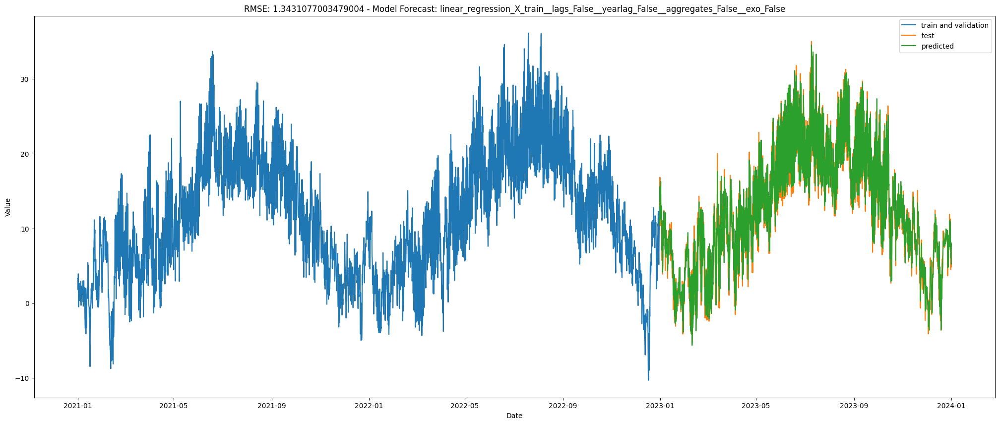

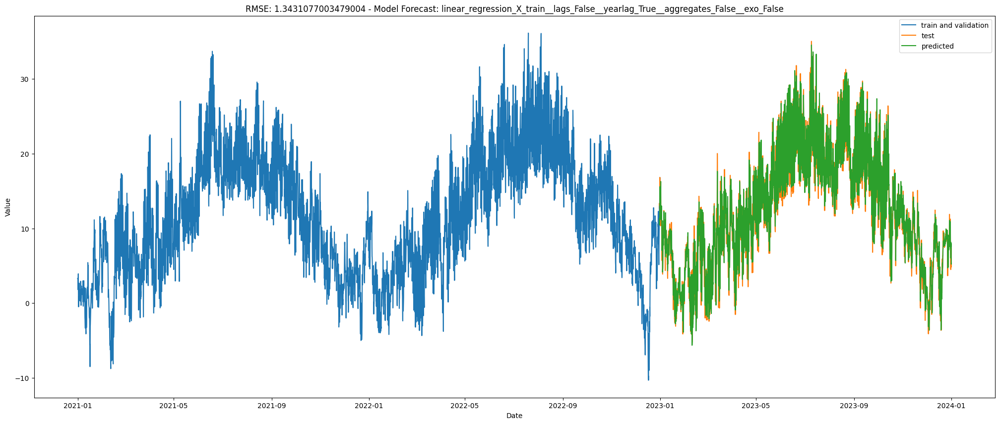

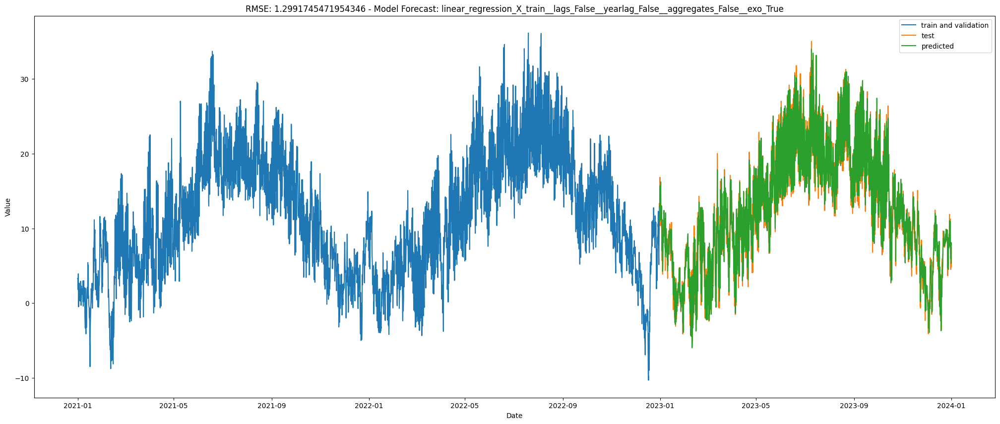

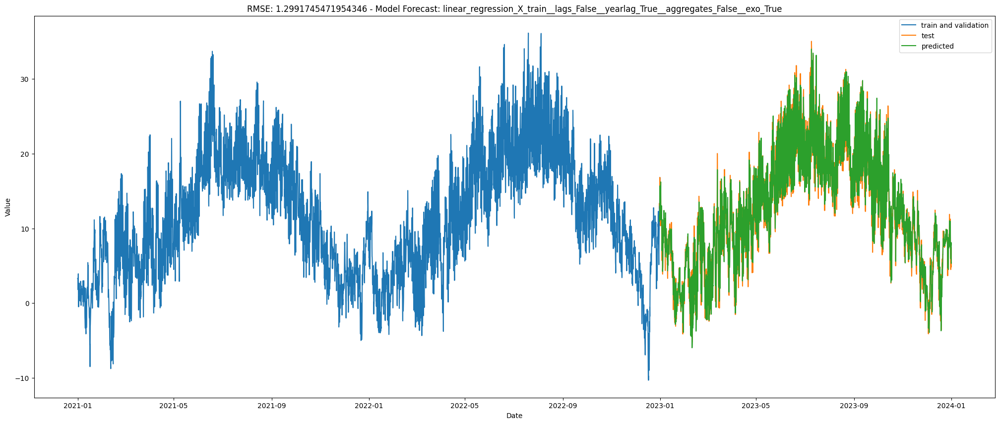

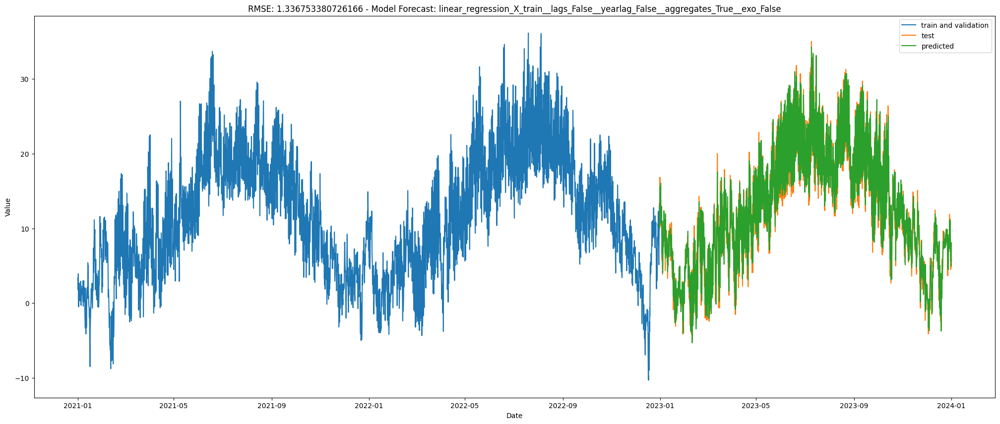

...

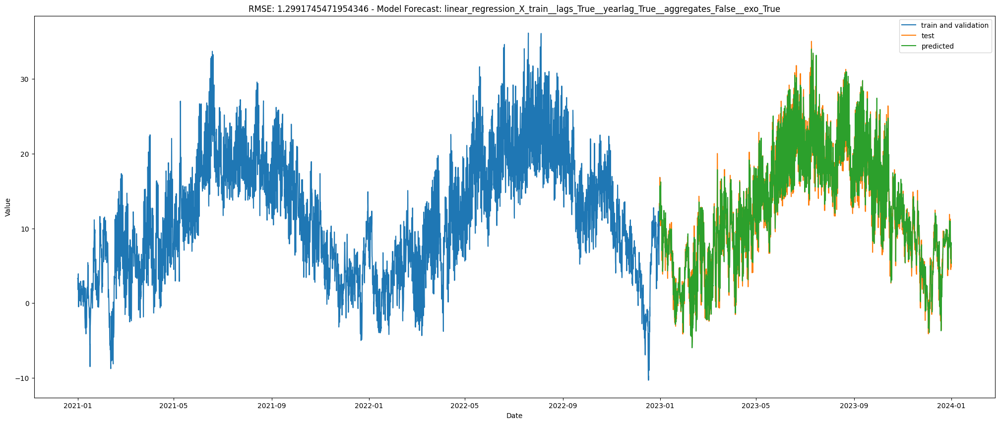

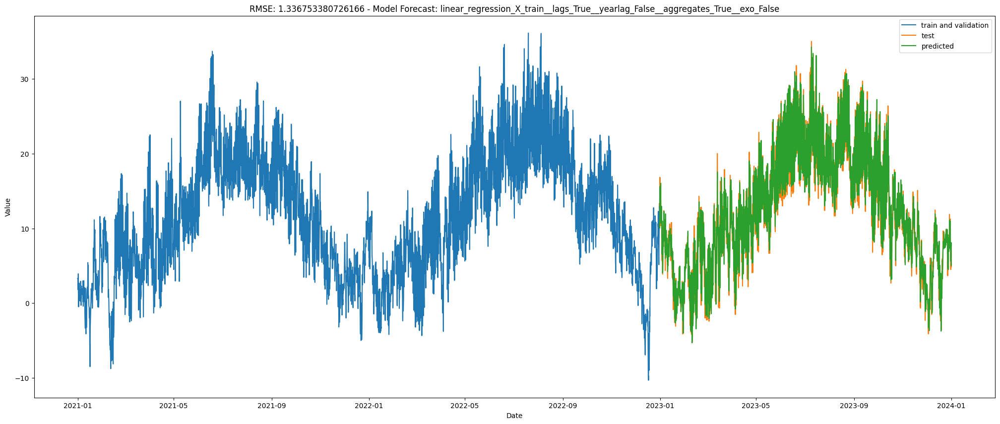

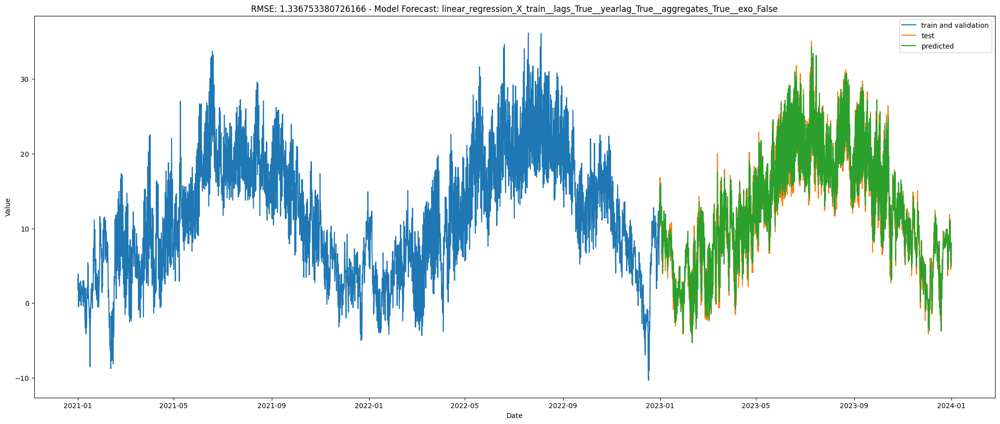

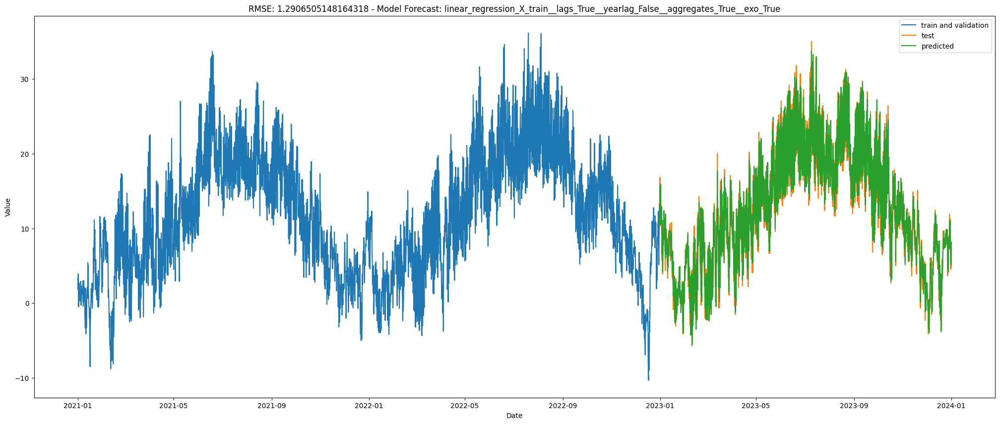

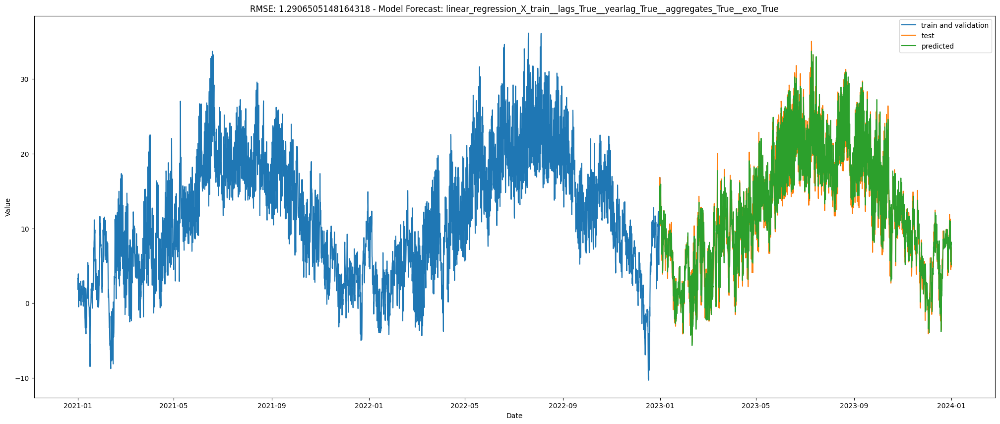

In [ ]:
for result in lr_results:
  plot_forecast(y_train, y_test, result['y_pred'], result["name"], result['rmse'])

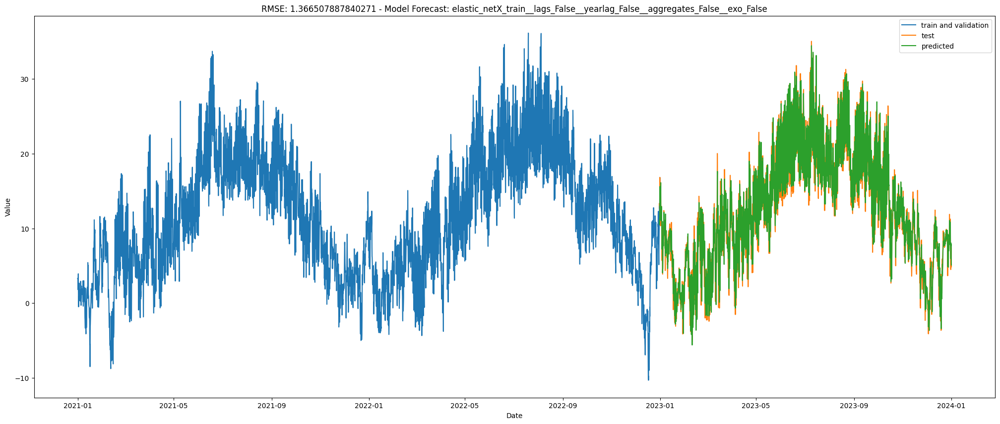

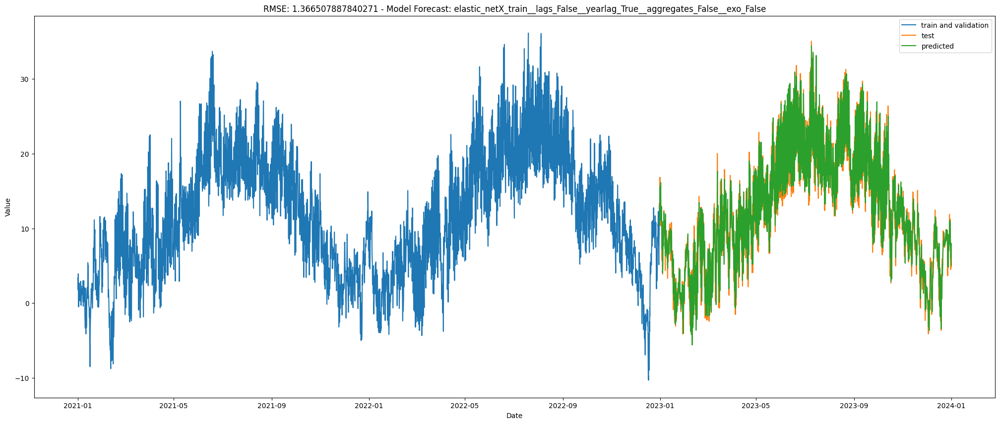

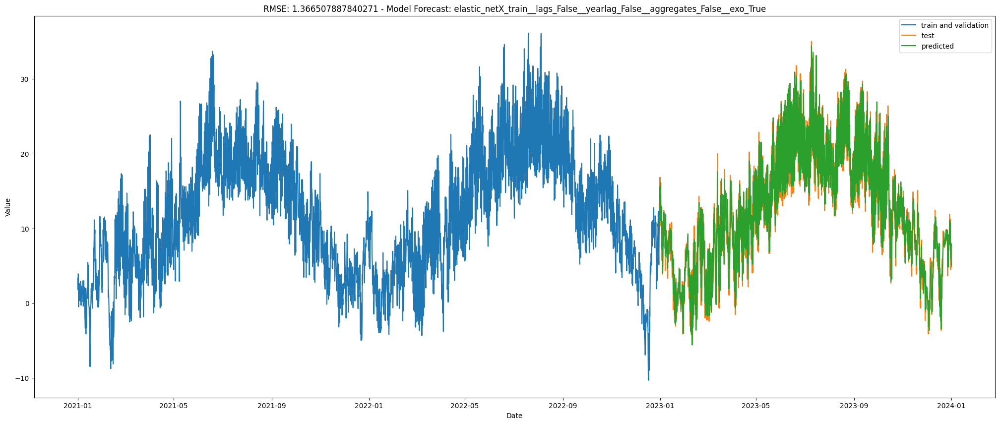

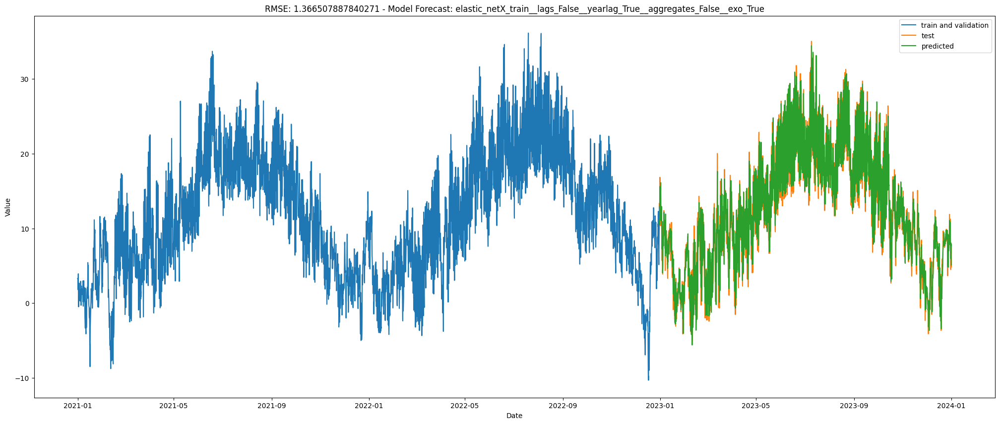

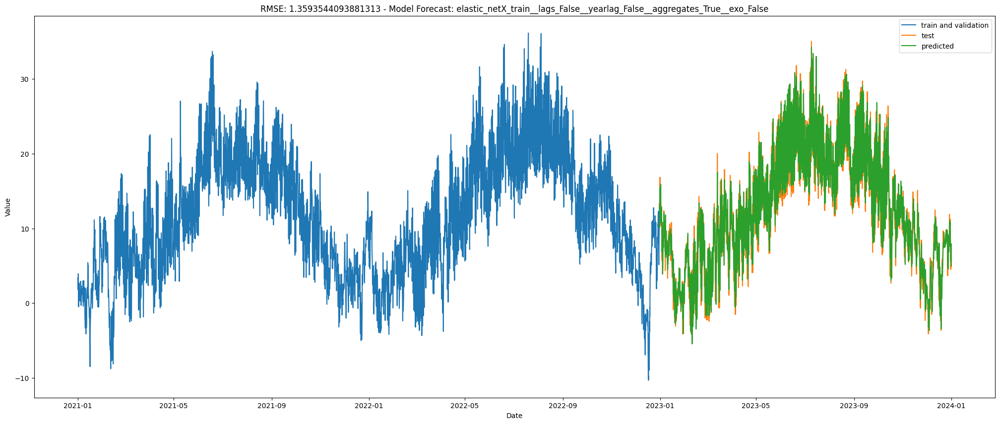

...

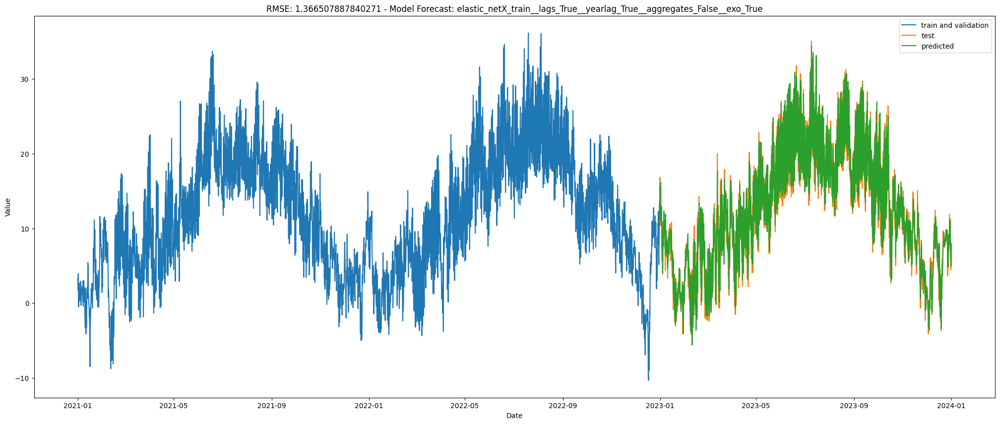

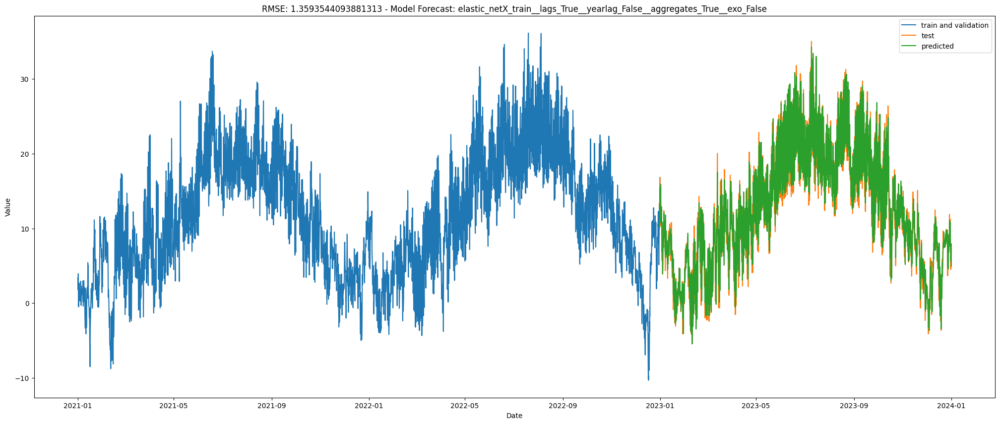

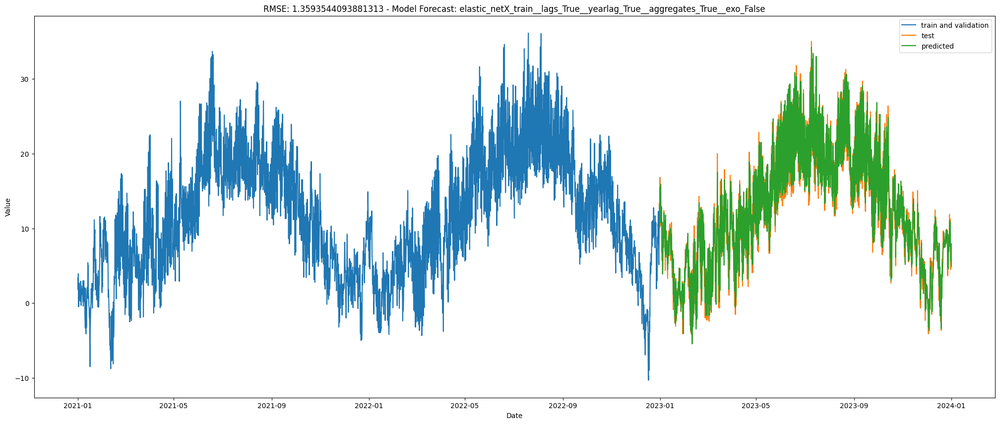

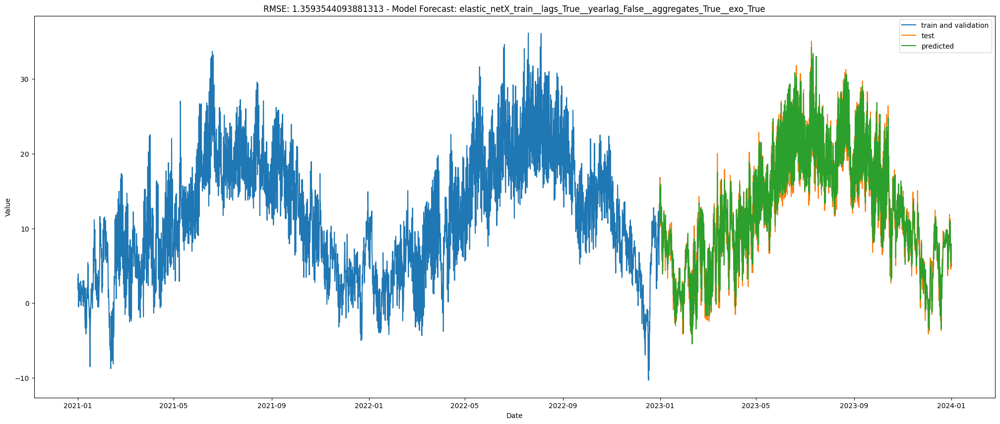

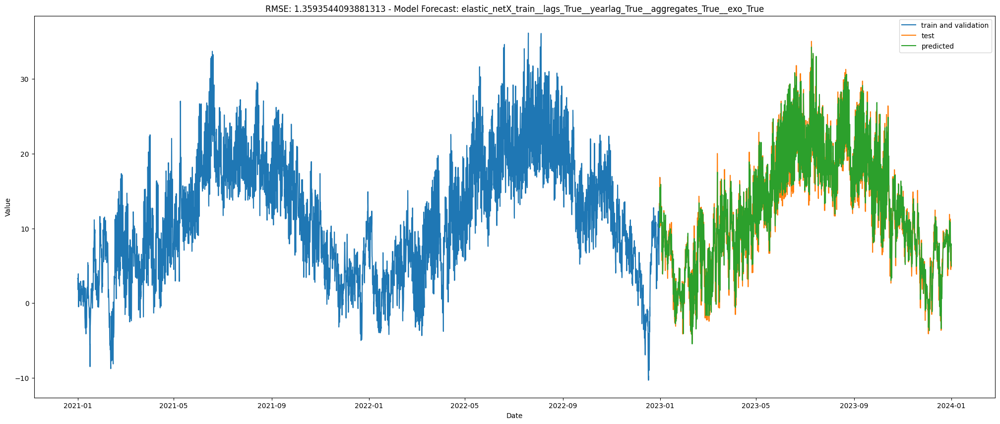

In [ ]:
for result in elasticnet_results:
  plot_forecast(y_train, y_test, result['y_pred'], result["name"], result['rmse'])

In [ ]:
# Append results from lr_results
for result in lr_results:
    all_results.append({'name': result['name'], 'rmse': result['rmse']})

# Append results from elasticnet_results
for result in elasticnet_results:
    all_results.append({'name': result['name'], 'rmse': result['rmse']})

results = pd.DataFrame(all_results)





In [ ]:
pd.set_option('display.max_colwidth', None)
results.sort_values(by='rmse')

,name,rmse
10,linear_regression_X_train__lags_False__yearlag_False__aggregates_True__exo_True,1.290651
19,linear_regression_X_train__lags_True__yearlag_True__aggregates_True__exo_True,1.290651
18,linear_regression_X_train__lags_True__yearlag_False__aggregates_True__exo_True,1.290651
11,linear_regression_X_train__lags_False__yearlag_True__aggregates_True__exo_True,1.290651
15,linear_regression_X_train__lags_True__yearlag_True__aggregates_False__exo_True,1.299175
14,linear_regression_X_train__lags_True__yearlag_False__aggregates_False__exo_True,1.299175
6,linear_regression_X_train__lags_False__yearlag_False__aggregates_False__exo_True,1.299175
7,linear_regression_X_train__lags_False__yearlag_True__aggregates_False__exo_True,1.299175
16,linear_regression_X_train__lags_True__yearlag_False__aggregates_True__exo_False,1.336753
17,linear_regression_X_train__lags_True__yearlag_True__aggregates_True__exo_False,1.336753


The LR and the elastic net are way better than arima, sarima and sarimax.

Important for a good prediction seems to be the aggregated values (means) and the exogene values (dew_point).

The model I use in the API won't have the dew_point nor the 7 lags (but the yearly lags and the other aggregated means)

Critique: we didn't use cross validation

# Residuals

Residuals are the difference between the predicted values and the actual values.   
  
A good model has residuals that are similar to white noise, so the residuals should be normally distributed and uncorrelated

## Verifying the distribution and correlation of the resiudals

In [ ]:
model_to_keep_name = "linear_regression_X_train__lags_False__yearlag_True__aggregates_True__exo_False"

In [ ]:
filter_model = [result for result in lr_results if result['name'] == model_to_keep_name]

model_data = filter_model[0]

model_data

{'y_pred': array([10.75483469, 10.02847085, 11.23492161, ...,  8.09428794,
         5.01369041,  5.20227653]),
 'rmse': 1.336753380726166,
 'name': 'linear_regression_X_train__lags_False__yearlag_True__aggregates_True__exo_False'}

In [ ]:
residuals = y_test - model_data['y_pred']

In [ ]:
residuals

date
2022-12-31 00:00:00+00:00    2.343165
2022-12-31 03:00:00+00:00    3.336196
2022-12-31 06:00:00+00:00    1.413078
2022-12-31 09:00:00+00:00    3.801704
2022-12-31 12:00:00+00:00    2.789468
                               ...   
2023-12-31 09:00:00+00:00   -1.370612
2023-12-31 12:00:00+00:00   -0.163924
2023-12-31 15:00:00+00:00   -2.012955
2023-12-31 18:00:00+00:00    0.517643
2023-12-31 21:00:00+00:00   -0.354276
Freq: 3H, Name: temperature_2m, Length: 2928, dtype: float64

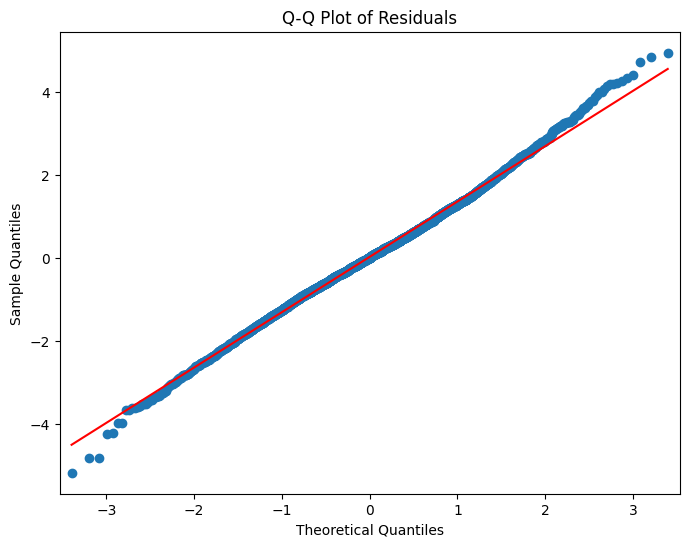

In [ ]:
# Create the Q-Q plot
fig, ax = plt.subplots(figsize=(8, 6))
sm.qqplot(residuals, line='s', ax=ax)
ax.set_title('Q-Q Plot of Residuals')
plt.show()

The observed quantils align almost perfectly with the theoretical quantiles along the straight line. (normal distribution) The tails represent outliers or extreme values in the dataset.

<Axes: xlabel='date'>

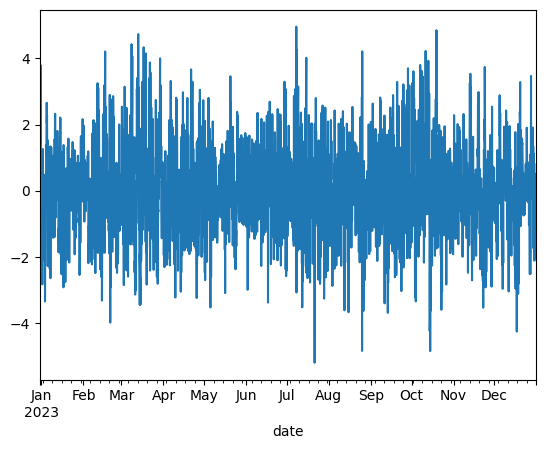

In [ ]:
residuals.plot()

In [ ]:
# Calculate the standard deviation of the residuals
residuals_std = residuals / np.std(residuals)

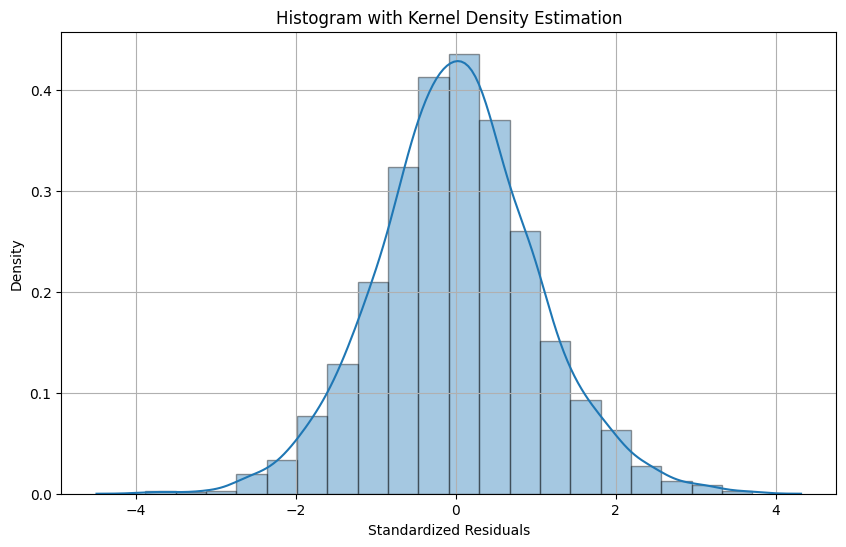

In [ ]:
plt.figure(figsize=(10, 6))
sns.distplot(residuals_std, bins=20, kde=True, hist_kws={'edgecolor': 'black'})
plt.title('Histogram with Kernel Density Estimation')
plt.xlabel('Standardized Residuals')
plt.ylabel('Density')
plt.grid(True)
plt.show()

<Figure size 640x480 with 0 Axes>

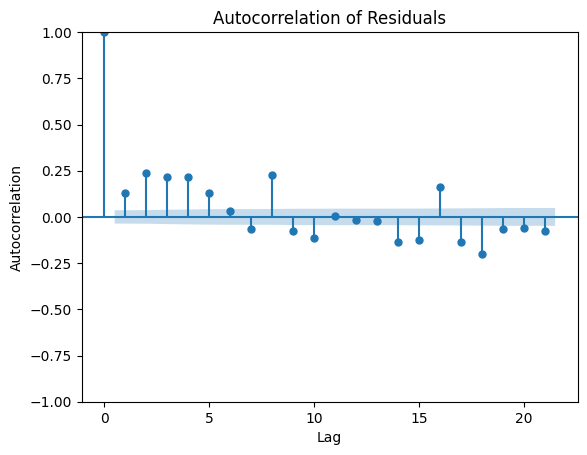

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf

plt.figure()
plot_acf(residuals, lags=21)  # 3 days
plt.title('Autocorrelation of Residuals')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

Even if the Autocorrelation shows a correlation in the first 8 lags, this is due to how our data is splitted (every 3 hours, a day = 8 lags).

  
Otherwise, we can say that the distribution of the residuals is very close to a normal distribution

## Ljung-Box Test

statistical test to determine wheter the autocorrelation of a group of data is significantly different from 0

In [ ]:
from statsmodels.stats.diagnostic import acorr_ljungbox


In [ ]:
# Ljung-Box test
lb_test_results = acorr_ljungbox(residuals, lags=(14))

lb_test_results

,lb_stat,lb_pvalue
1,50.120766,1.445689e-12
2,218.406956,3.745692e-48
3,357.059971,4.415036e-77
4,496.807578,3.284795e-106
5,546.623201,6.855075e-116
6,550.071721,1.362543e-115
7,561.887085,3.904893e-117
8,712.009067,1.858128e-148
9,729.287345,3.486088e-151
10,767.575096,1.922544e-158


There seems to be a strong autocorrelation, but as seen before, of course there is a strong correlation between data of the same day.